1 case of SDC with core only in all SG bands
1 case of SDC with 5LPI in all SG bands
1 case of SDC+removal diffraction with 5LPI in all SG bands

In [82]:
import glob
import os
import pdb

import astropy
import matplotlib.pyplot as plt
import muse
import numpy as np
import scipy
import xarray as xr
# from muse.inversions.inversions import mass_screen_gcompile
from muse.inversions.models import SVD as svd
from muse.utils.sdc_benchmark import sdc_benchmark as bench
from skglm import Lasso
from sklearn.linear_model import LassoLars as LassoLars
from sklearn.linear_model import Ridge as Ridge

In [2]:
from matplotlib import colors
from muse.synthesis.synthesis import add_noise_poisson, add_noise_readout, exposure_time, vdem_synthesis
from muse.instr.utils import sum_lines_per_band
# from muse.inversions.inversions import ci_data_driven_mask

In [3]:
import contextlib
import os
import platform
import time
import warnings
from datetime import datetime
from pathlib import Path

import dask
import numpy as np
import xarray as xr
from dateutil.tz import gettz
from matplotlib import pyplot as plt

from muse import logger
from muse.instr.utils import (
    ci2sg_response_format,
    convert_resp2muse_resp,
    create_resp_func,
    create_resp_line_list,
    sum_lines_per_band,
    sum_lines_slits_per_band,
)
from muse.inversions.inversions import mask_response, vdem_solve
from muse.synthesis.synthesis import (
    add_noise_poisson,
    add_noise_readout,
    calc_error,
    exposure_time,
    ph2dn,
    transform_resp_units,
    vdem_synthesis,
)
from muse.transforms.transforms import muse_fov, reshape_rs2x, reshape_x2rs
from muse.utils.fitting import gaussian_fitting_analysis, masker
from muse.utils.forward_pipeline import get_muse_version
from muse.utils.miscellaneous import (
    get_moment_limits,
    get_outliers_newer,
    plot_nine_conts,
    plot_slit_cont_maps,
    plot_with_chisquare,
)
from muse.utils.utils import confusion_masked, read_response, sub_contaminants

def _read_and_concat_responses(resp_path, names, logT, vdop, slit, logTmethod="nearest", vdopmethod="linear"):
    """
    Read a list of response zarrs in parallel and concat along 'line'.
    """
    with dask.config.set(**{"array.slicing.split_large_chunks": False}):
        resp_list = [
            read_response(
                str(Path(resp_path) / fname), logT=logT, vdop=vdop, slit=slit, logTmethod=logTmethod, vdopmethod=vdopmethod
            ).compute()
            for fname in names
        ]
    return xr.concat(resp_list, dim="line")

In [4]:
model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr"
resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/"
resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/"
FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/"
effect_area_108="effective_area_band_108_JMS_2024-10-31.zarr"
effect_area_171="effective_area_band_171_JMS_2024-10-31.zarr"
effect_area_284="effective_area_band_284_JMS_2024-10-31.zarr"
obs_filename_ci=None
obs_filename_sg=None
gt_filename_sg=None
serial_gfat=False
run_SDC=True
serial_SDC=True
run_mask=None  # ["gt_vdem" "redundant" "intensity" "data_driven"]
redundant_mask=None
velbin_inv=None
tgbin_inv=None
ntgbin_inv=None
rotate=False
saturation=None
KEYS=None  # [None"middle""bottom" "all"]
target=None  # ["QS""AR""FL"]
jump_pix=None  # [1010] Jump in y-axis and t-step
logT=None
vdop=None
logT_inv=None
vdop_inv=None
nslits=35
model=None
model2=None
data_driven_mask_model=None
data_driven_mask_keyword=None
exp_time=0.1
noise=False
noise_seed=123456789
readoutnoise=2.24
compression: int = 1
npix=2
max_vel=50
velocity_range=50
velocity_range_gt=None
velocity_range_guided=None
intensity_scaling=None  # ["noise" "no_noise" None]
response_info="0.390/0.780 A"
line=None
savefigs=True
savepath="./"
save_id=""
savelogfile="sdc_benchmark.json"
logger=logger
save_output=False
save_output_netcdf=False
author="JMS"
appendlog=None
disable_pbar=False
run_cont_id=False
dens_eff=1e9  # The VDEM could be expanded to include density dependence (and the response function)
pres_eff=3e15  # The VDEM could be expanded to include density dependence (and the response function)
lgtgmin_eff=4.8
int_cont_ratio=1e2
main_lines_cont=None
n_cont_top=20
cuda_device=3
pad_value=3
response_scaling=None  # "auto" None
unmask_outliers=True
randomizeSVD=True
muse_fov_mode="wrap"
thresholds_ph=None
thresholds_dn=None
passbands_to_solve=None

In [5]:
dpth_vdem_m_flare="/net/triad/Volumes/Space/MUSE_GCP/muse_vdems/vdems_models/m_flare_muram_trac/"

FeXIX_108_resp="respfunc_108_fe_19_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
FeXXI_108_resp="respfunc_108_fe_21_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_108_resp="respfunc_108-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31_VU_2025-02-12.zarr"
FeIX_171_resp="respfunc_171_fe_9_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_171_resp="respfunc_171-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
FeXV_284_resp="respfunc_284_fe_15_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_284_resp="respfunc_284-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2025-03-28.zarr"
ci_195_resp="respfunc_ci_cut_195_sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31a.zarr"
dpth_resp="/net/triad/Volumes/Space/MUSE_GCP/muse_response_function/Base_line/"

In [6]:
base_path = '/Users/khcho/MUSE/diffraction/555LPI_test'
os.chdir(base_path)
import sys
sys.path.append(base_path)

from benchmark_diffraction import sdc_benchmark
import importlib
import benchmark_diffraction
importlib.reload(benchmark_diffraction)
from benchmark_diffraction import sdc_benchmark as bench_diff
save_path = '/Users/khcho/MUSE/diffraction/555LPI_test'  # change intensity scaling "no_noise"


In [7]:
## parameters

model_path=dpth_vdem_m_flare
model_name='muse_vdem_m-flare-muram_los2_trac_fixedvdop_JMS_2May2025_555806.zarr'
resp_path_sg=dpth_resp+'response_functions_with_slits/'
# resp_path_ci=dpth_resp+'response_functions_CI/'
resp_path_ci=None 
FeXIX_108_resp=FeXIX_108_resp
FeXXI_108_resp=FeXXI_108_resp
contam_108_resp=contam_108_resp
FeIX_171_resp=FeIX_171_resp
contam_171_resp=contam_171_resp
FeXV_284_resp=FeXV_284_resp
contam_284_resp=contam_284_resp
# ci_195_resp=ci_195_resp
ci_195_resp=None
#velbin_inv=5 #[5,10,15,20,30]
vdop = np.arange(-500, 510, 10)   #controls VDEM and Response Functions (no noise exp.)
vdop_inv = np.arange(-500, 510, 10) #controls only Response Functions in the inversions (fixed no noise exp.)

velocity_range = 80 
velocity_range_guided = 400 

run_SDC=True
serial_SDC=False
exp_time=0.6    #noise exp: 0.1, 0.6, 1.8 s
obs_filename_ci=None
obs_filename_sg=save_path+'/specsum_only_core.zarr'
gt_filename_sg=save_path+'/specsum_gt.zarr'
syn_path="./"
KEYS=['all']
# jump_pix = [16 16] 
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
intensity_scaling="noise"
model = Lasso(alpha=1e-3, positive=True, fit_intercept=False, max_epochs=500) 
run_mask = None 
savefigs=True
savepath=save_path
noise = False   #noise exp
save_output = True
save_id=f'only_core' 


In [15]:
# kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 70, "fwhm": 0.5, "transmission": 0.81}
kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 5, "fwhm": 0.5, "transmission": 0.97}
if True:
    sg_files = [
            FeXIX_108_resp,
            FeXXI_108_resp,
            contam_108_resp,
            FeIX_171_resp,
            contam_171_resp,
            FeXV_284_resp,
            contam_284_resp,
        ]
    logTmethod = "nearest"  # Use nearest method for the temperature
    slit = np.arange(nslits)
    response = _read_and_concat_responses(resp_path_sg, sg_files, logT, vdop, slit, logTmethod)
    response = response.assign_coords(band=("line", [108, 108, 108, 171, 171, 284, 284]))
    response = response.compute()
    logT = response.logT
    vdop = response.vdop
    response["SG_resp"] = response.SG_resp.fillna(0.0)
    response.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/response.zarr', mode='w')
    
    
    vdem_muse_fov = xr.open_dataset(str(Path(model_path) / model_name)).compute()
    vdem_muse_fov = muse_fov(vdem_muse_fov, rotate=None, mode=muse_fov_mode)
    vdem_muse_fov_rs = reshape_x2rs(vdem_muse_fov)
    vdem_muse_fov_rs = vdem_muse_fov_rs.sel(logT=response.logT, vdop=response.vdop, drop=True, method="nearest")
    vdem_muse_fov_rs = vdem_muse_fov_rs.interp(vdop=vdop).fillna(0.0)
    
    spectrum_synthesis = vdem_synthesis(
                         vdem_muse_fov_rs,
                         response,
                         sum_over=["logT", "vdop"],
    )
    
    from muse.instr.psf import convolve_model_psf
    from muse.instr.utils import sum_lines_per_band, sum_lines_slits_per_band
    from muse.synthesis.synthesis import vdem_syn_join_slits_wvl
    from muse.instr.gausslobes import gausslobes
    from muse.transforms.transforms import muse_interp_xyw2rssg
    
    spec_gt = exposure_time(spectrum_synthesis, exp_time=exp_time)
    spec_gt.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_gt.zarr', mode='w')
    spec_gt_noise = add_noise_poison(spectrum_synthesis, response=response)
    spec_gt_noise = ph2dn(spec_gt_noise, response=response)
    spec_gt_noise = add_noise_readout(spec_gt_noise, response=response, 
                                      compression=compression, seed=noise_seed)
    spec_gt_noise.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_gt_noise.zarr', mode='w')
    
    
    spec_merge_line = vdem_syn_join_slits_wvl(response, vdem_muse_fov_rs, line=response.line[[0, 3, 5]])
    spec_merge_line['gain'] = xr.DataArray([10, 10, 10], coords={'band':spec_merge_line.band}, dims='band')
    
    spec_with_psf = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, band=[108,171,284])
    muse_spec_psf, resp = muse_interp_xyw2rssg(spec_with_psf,response, line=response.line[[0, 3, 5]])
    muse_spec_psf['gain'] = xr.DataArray([10, 10, 10], coords={'band':muse_spec_psf.band}, dims='band')
    specsum_psf = sum_lines_slits_per_band(muse_spec_psf)
    specsum_diff = exposure_time(specsum_psf, exp_time=exp_time)
    # specsum_psf = ph2dn(specsum_psf, response)
    # specsum_psf = specsum_psf.swap_dims({'line':'band'})
    specsum_diff.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_diff.zarr', mode='w')
    
    spec_only_core = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, band=[108,171,284],only_core=[True]*3)
    muse_spec_only_core, resp = muse_interp_xyw2rssg(spec_only_core,response, line=response.line[[0, 3, 5]])
    muse_spec_only_core['gain'] = xr.DataArray([10, 10, 10], coords={'band':muse_spec_only_core.band}, dims='band')
    specsum_only_core = sum_lines_slits_per_band(muse_spec_only_core)
    specsum_only_core = exposure_time(specsum_only_core, exp_time=exp_time)
    # specsum_only_core = ph2dn(specsum_only_core, response)
    # specsum_only_core = specsum_only_core.swap_dims({'line':'band'})
    specsum_only_core.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_only_core.zarr', mode='w')
    spec_slit_only_core = exposure_time(muse_spec_only_core, exp_time=exp_time)
    spec_slit_only_core.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/spec_slit_only_core.zarr', mode='w')
else: 
    response = xr.open_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/response.zarr').compute()
    spec_gt = xr.open_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_gt.zarr').compute()
    specsum_diff = xr.open_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_diff.zarr').compute()
    specsum_only_core = xr.open_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_only_core.zarr').compute()

2025-07-21 15:25:40.540 | INFO     | muse.transforms.transforms:muse_fov:71 - vdem has already the MUSE pixel size


In [989]:
cen_sgx = np.abs(spec_merge_line.SG_wvl.sel(band=284) - spec_merge_line.line_wvl.sel(band=284)).argmin(dim='SG_xpixel')
aa = spec_merge_line.flux.sel(band=284, 
                         SG_xpixel=cen_sgx, 
                         method='nearest')


In [1127]:
aa_core = spec_only_core.flux.sel(band=284, SG_xpixel=cen_sgx, method='nearest').transpose('y', 'x')

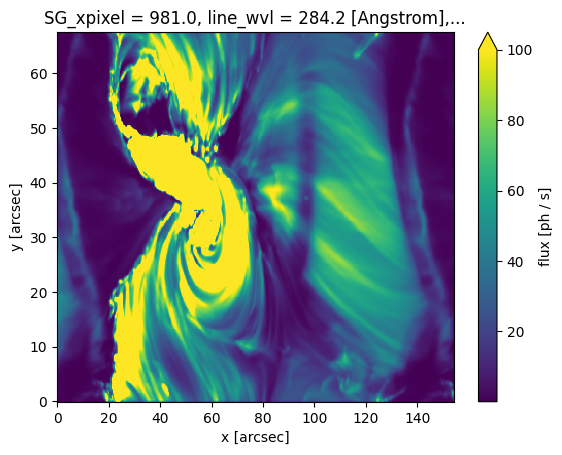

In [1128]:
aa_core.plot(vmax=100)

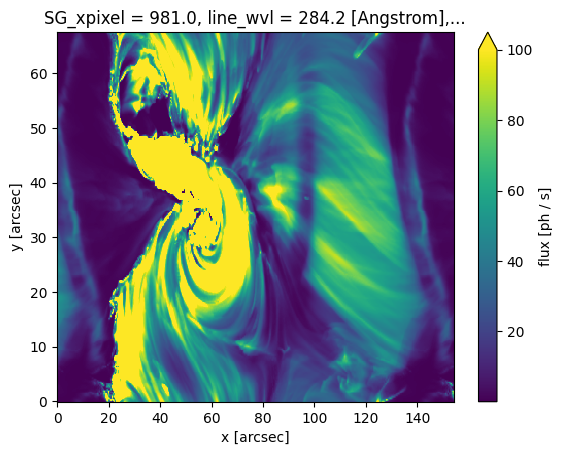

In [990]:
aa.plot(vmax=100)

In [991]:
from scipy.signal import fftconvolve, deconvolve
from scipy.fftpack import fftn, ifftn, fftshift, ifftshift
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import diffraction_removal_in_2d, find_sgx_pixel_from_wavelength
import astropy.units as u

In [1113]:
psf = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs).T
psf_core = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs, only_core=True).T
n_psf = psf / np.sum(psf)
# bbb = fftconvolve(aa, psf, mode='same')

In [993]:
ay, ax = aa.shape
psfy, psfx = psf.shape

In [1152]:
import astropy.units as u
import numpy as np
import xarray as xr

from muse.utils.utils import add_history
from muse import logger
from muse.instr.utils import filter_mesh_parameters
from muse.transforms.transforms import reshape_rs2x
from muse.utils.utils import add_history
from muse.variables import CHANNEL_MAP

def match_size(img, psf):
    imgy, imgx = img.shape
    psfy, psfx = psf.shape
    rx = np.ceil((imgx + psfx - 1)/imgx*0.5)*2
    ry = np.ceil((imgy + psfy - 1)/imgy*0.5)*2
    nx = int(imgx*rx)
    ny = int(imgy*ry)
    new_img = np.zeros((ny, nx))
    for j in range(4):
        for i in range(4):
            new_img[imgy*j:imgy*(j+1), imgx*i:imgx*(i+1)] = img[::(-1)**j, ::(-1)**i]
    new_psf = np.zeros((ny, nx))
    new_psf[:psfy, :psfx] = psf    
    return new_img, new_psf

def fftconv(img, psf, crop=True):
    imgy, imgx = img.shape
    psfy, psfx = psf.shape
    new_img, new_psf = match_size(img, psf)
    conv = np.real(np.fft.ifft2(np.fft.fft2(new_img)*np.fft.fft2(new_psf)))
    if crop:
        conv = conv[psfy//2:psfy//2+imgy, psfx//2:psfx//2+imgx]
    return conv

def convolve_model_psf(
    spectrum,
    model,
    *,
    fixed_psf_per_channel=False,
    band=(284,),
    inplace=False,
    **kwargs,
):
    """
    Given an input spectrum with coordinates x, y (spatial) and wavelength,
    convolve the flux variable at each wavelength slice with the instrument
    point spread function.

    Parameters
    ----------
    spectrum : xarray.Dataset
        Dataset with flux variable on x, y, wavelength, ... coordinates
    model: func
        PSF Model to use. The args and kwargs are passed to the model
        e.g., model = gausslobes
    fixed_psf_per_channel: bool, optional
        Use a constant PSF in each wavelength channel, by default False
    inplace: bool, optional
        Do inplace modification of spectrum, or return a copy, by default False

    Returns
    -------
    xarray.Dataset
        Dataset with the same quantities as input.
    """
    output = spectrum.copy(deep=not inplace)
    assert "flux" in output.variables
    if "x" not in output.coords:
        output = reshape_rs2x(output)
    assert "y" in output.coords
    assert "SG_wvl" in output
    assert "band" in output.coords
    if "band" not in output.dims:
        output = output.swap_dims({"line": "band"})
    output = output.transpose("x", "y", ...)
    for a_band in band:
        if "band" not in output.dims:
            output = output.swap_dims({"line": "band"})
        lineflux = output.sel(band=a_band)
        if "line" in lineflux.coords and "band" in lineflux.dims:
            lineflux = lineflux.swap_dims({"band": "line"})
            if "band" in output.dims:
                output = output.swap_dims({"band": "line"})
            for iline in lineflux.line:
                lineflux_2 = lineflux.sel(line=iline)

                logger.debug(f"Convolving band: {a_band}")
                if fixed_psf_per_channel:
                    # Use a gausslobes PSF for each channel (i.e. ignore wavelength dependence)
                    pp0 = model(wavelength=a_band * u.AA, **kwargs)
                if "time" in lineflux_2.dims:
                    for i, w in enumerate(tqdm(lineflux_2.SG_wvl.data)):
                        if np.isnan(w):
                            continue
                        if not fixed_psf_per_channel:
                            pp0 = model(wavelength=w * u.AA, **kwargs)
                        for iitime, itime in enumerate(lineflux_2.time):
                            obj = lineflux_2.flux.isel(SG_xpixel=i, time=iitime).data
                            if obj.max() > 0:
                                output["flux"].loc[{"line": iline, "SG_xpixel": i, "time": itime}] = fftconv(
                                    obj,
                                    pp0,
                                )
                else:
                    for i, w in enumerate(tqdm(lineflux_2.SG_wvl.data)):
                        if np.isnan(w):
                            continue
                        if not fixed_psf_per_channel:
                            pp0 = model(wavelength=w * u.AA, **kwargs)

                        obj = lineflux_2.flux.isel(SG_xpixel=i).data
                        if obj.max() > 0:
                            output["flux"].loc[{"line": iline, "SG_xpixel": i}] = fftconv(obj, pp0)

        else:
            logger.debug(f"Convolving band: {a_band}")
            if fixed_psf_per_channel:
                # Use a gausslobes PSF for each channel (i.e. ignore wavelength dependence)
                pp0 = model(wavelength=a_band * u.AA, **kwargs)
            for i, w in enumerate(lineflux.SG_wvl.data):
                if np.isnan(w):
                    continue
                if not fixed_psf_per_channel:
                    pp0 = model(wavelength=w * u.AA, **kwargs)
                if "time" in lineflux.dims:
                    for iitime, itime in enumerate(lineflux.time):
                        obj = lineflux.isel(SG_xpixel=i, time=iitime).data
                        if obj.max() > 0:
                            output["flux"].loc[{"band": a_band, "SG_xpixel": i, "time": itime}] = fftconv(
                                obj,
                                pp0,
                            )
                else:
                    obj = lineflux.flux.isel(SG_xpixel=i).data
                    if obj.max() > 0:
                        output["flux"].loc[{"band": a_band, "SG_xpixel": i}] = fftconv(obj, pp0)
    if "band" in spectrum.dims and "line" in output.dims:
        output = output.swap_dims({"line": "band"})
    add_history(output, locals(), convolve_model_psf)
    return output

In [1148]:
aa0, psf0 = match_size(aa, psf)

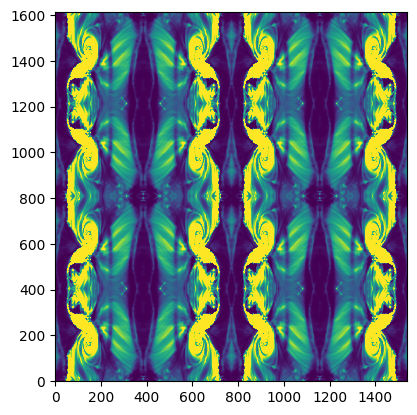

In [1149]:
plt.imshow(aa0, vmax=100)

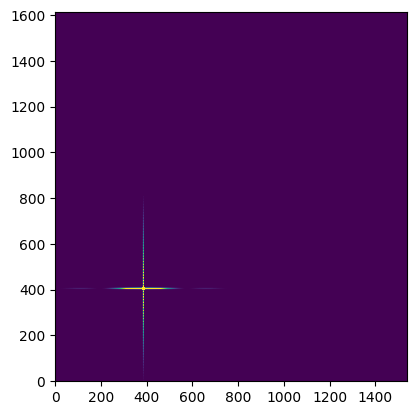

In [1150]:
plt.imshow(psf0, vmax=1e-5)

In [1093]:
# bb0 = np.real(ifftn(fftn(aa0)*fftn(psf0)))
bb = fftconv(aa, psf)
bb0 = fftconv(aa, psf, crop=False)

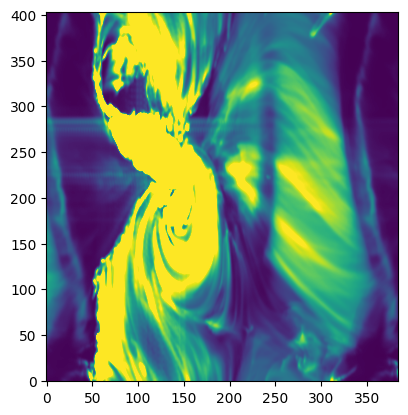

In [1072]:
plt.imshow(bb, vmax=100)

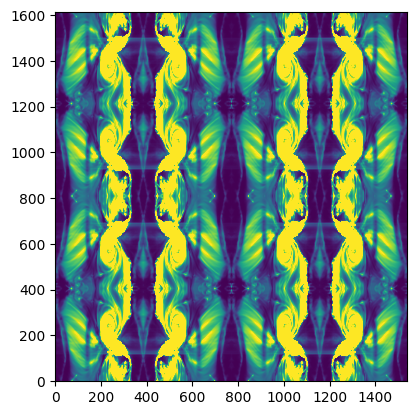

In [1094]:
plt.imshow(bb0, vmax=100)

In [1096]:
cc0 = np.real(np.fft.ifft2(np.fft.fft2(bb0)/np.fft.fft2(psf0)))

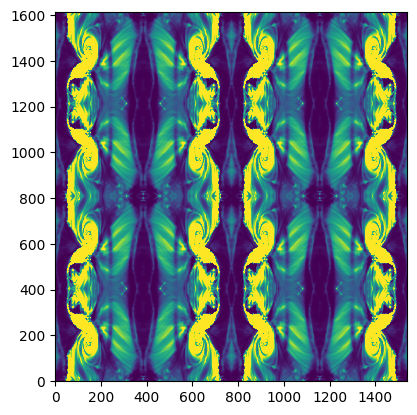

In [1098]:
plt.imshow(cc0, vmax=100)

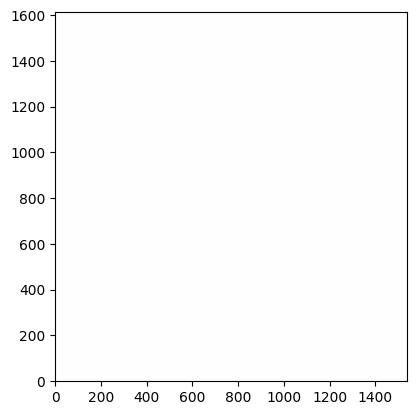

In [1099]:
plt.imshow(cc0-aa0, vmin=-1e2, vmax=1e2, cmap='bwr')

In [1119]:
iter = 25
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconv(img_decon,n_psf)
    img_decon = img_decon*fftconv(ratio, n_psf[::-1, ::-1])
cc = fftconv(img_decon/np.sum(psf), psf_core)    

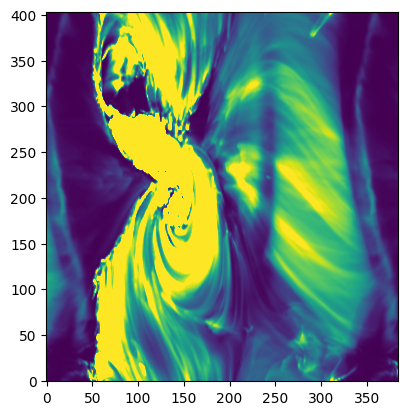

In [1115]:
plt.imshow(img_decon, vmax=1e2, vmin=0)

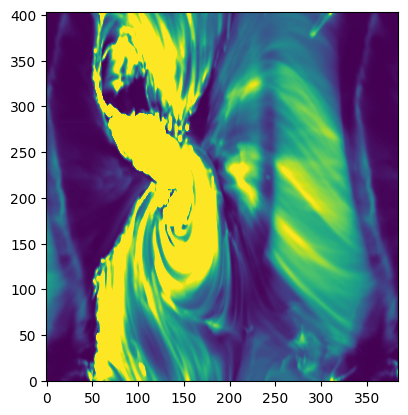

In [1102]:
plt.imshow(cc, vmax=1e2, vmin=0)

In [1084]:
print(np.mean(aa.values), np.mean(bb), np.mean(img_decon), np.mean(cc))

139.58865 167.5314964258131 167.53149642581315 157.6202152702166


In [1110]:
print(np.mean(aa0), np.mean(bb0), np.mean(img_decon), np.mean(cc0))

139.58863773252028 167.5314964258131 167.53149642581315 139.58863773252034


In [1089]:
0.97**2

0.9409

In [1087]:
print(np.sum(psf), np.sum(psf_core))

1.200180037194983 0.9408999999999998


In [1108]:
print(np.mean(aa.values), np.mean(bb), np.mean(img_decon), np.mean(cc))

139.58865 167.5314964258131 167.53149642581315 157.6202152702166


In [1117]:
np.mean(img_decon), np.mean(aa), np.mean(img_decon)/np.mean(aa), 

(167.53149642581303,
 <xarray.DataArray 'flux' ()>
 array(139.58865, dtype=float32)
 Coordinates:
     SG_xpixel  float64 981.0
     line_wvl   float64 284.2
     gain       int64 10
     band       int64 284
 Attributes:
     units:    ph / s,
 <xarray.DataArray 'flux' ()>
 array(1.2001799)
 Coordinates:
     SG_xpixel  float64 981.0
     line_wvl   float64 284.2
     gain       int64 10
     band       int64 284
 Attributes:
     units:    ph / s)

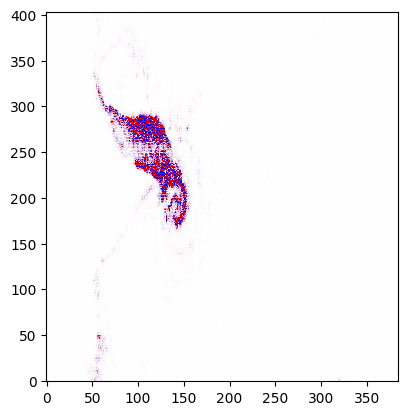

In [1120]:
plt.imshow(img_decon/np.sum(psf)-aa, vmin=-1e2, vmax=1e2, cmap='bwr')


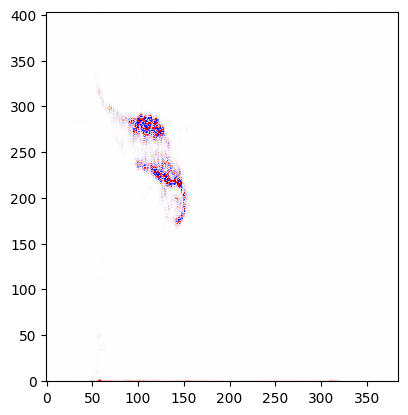

In [1131]:
plt.imshow(cc-aa_core, vmin=-1e2, vmax=1e2, cmap='bwr')


In [1076]:
iter = 25
psff = fftn(psf)
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconvolve(img_decon, psf, mode='same')
    img_decon = img_decon*fftconvolve(ratio, psf[::-1, ::-1], mode='same')
cc = fftconvolve(img_decon, psf_core, mode='same')    

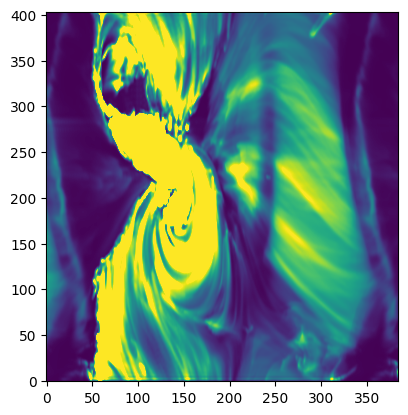

In [1077]:
plt.imshow(cc, vmax=1e2, vmin=0)

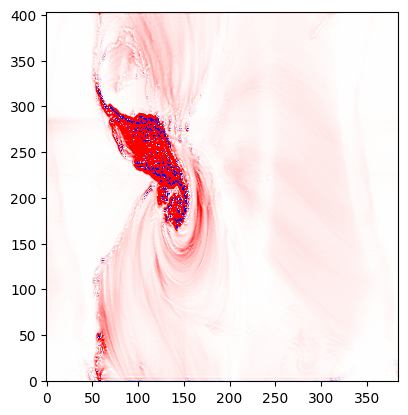

In [1078]:
plt.imshow(cc-aa, vmin=-1e2, vmax=1e2, cmap='bwr')

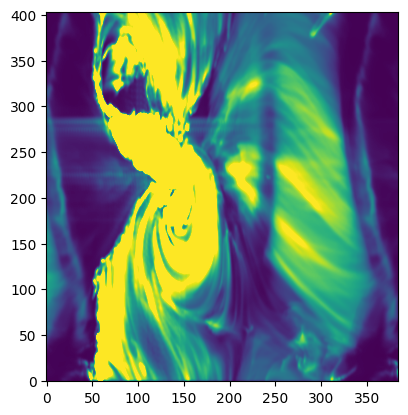

In [818]:
plt.imshow(bbb, vmax=100)

In [861]:
cc0 = np.real(ifftn(fftn(bb0)/fftn(psf0)))

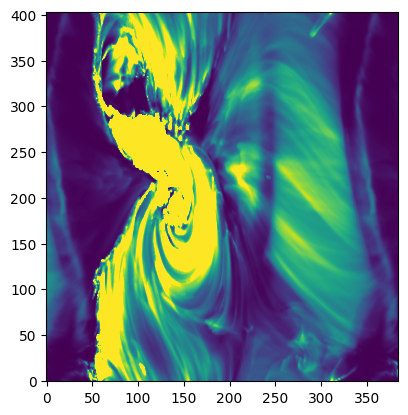

In [863]:
plt.imshow(cc0[:ay, :ax], vmin=0, vmax=100)

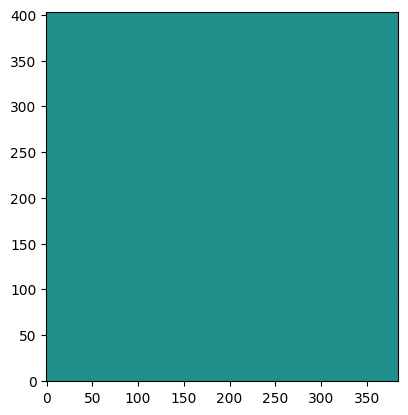

In [866]:
plt.imshow(cc0[:ay, :ax]-aa, vmin=-1e-5, vmax=1e-5)

In [819]:
cc = diffraction_removal_in_2d(xr.DataArray(bb, coords={'wave':aa.line_wvl}), 
                                            gausslobes_kwarg=kargs, core_psf=False)

In [820]:
cc = diffraction_removal_in_2d(xr.DataArray(bbb, coords={'wave':aa.line_wvl}), 
                                            gausslobes_kwarg=kargs, core_psf=False)

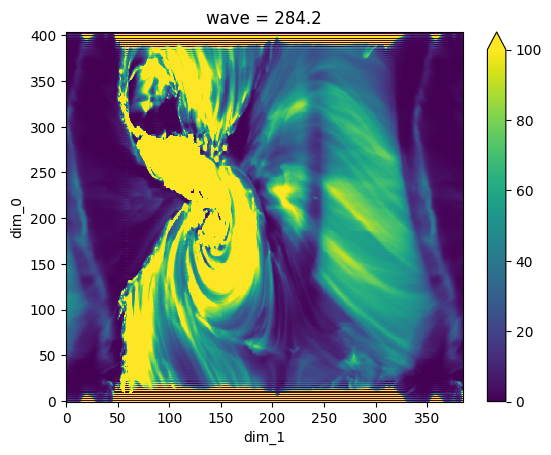

In [821]:
cc.plot(vmax=1e2)

In [822]:
bb = xr.DataArray(bb, coords={'wave':aa.line_wvl})

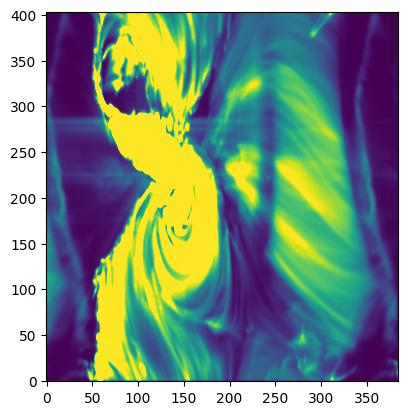

In [823]:
plt.imshow(bb, vmax=1e2)

In [824]:
cc = diffraction_removal_in_2d(bb, gausslobes_kwarg=kargs, core_psf=False)

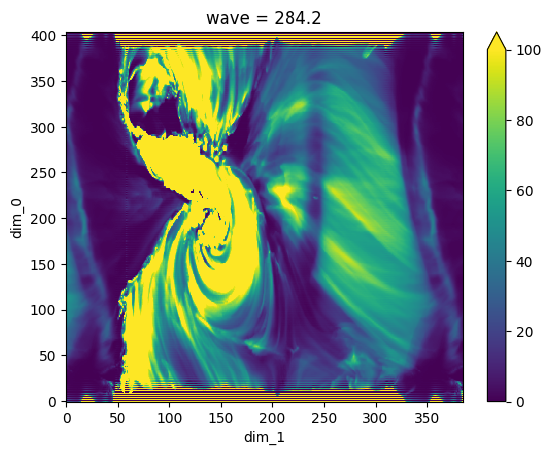

In [825]:
cc.plot(vmax=100)

In [951]:
bb01, psf0 = match_size(bb, psf)

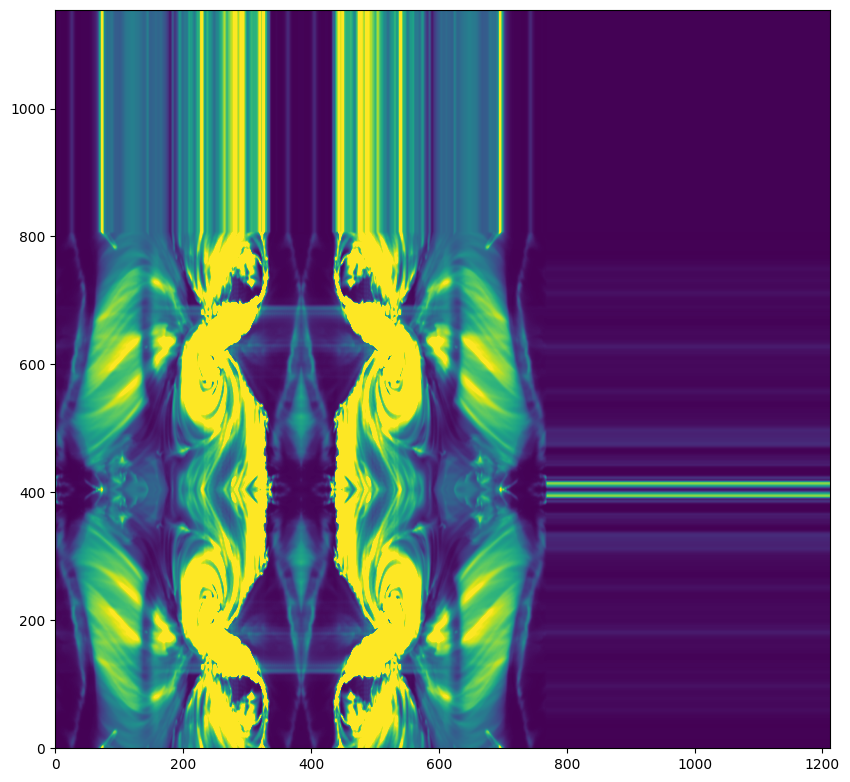

In [960]:
plt.imshow(bb01, vmax=100)
plt.gcf().set_size_inches(10, 10)


In [953]:
cc01 = np.real(ifftn(fftn(bb01)/fftn(psf0)))

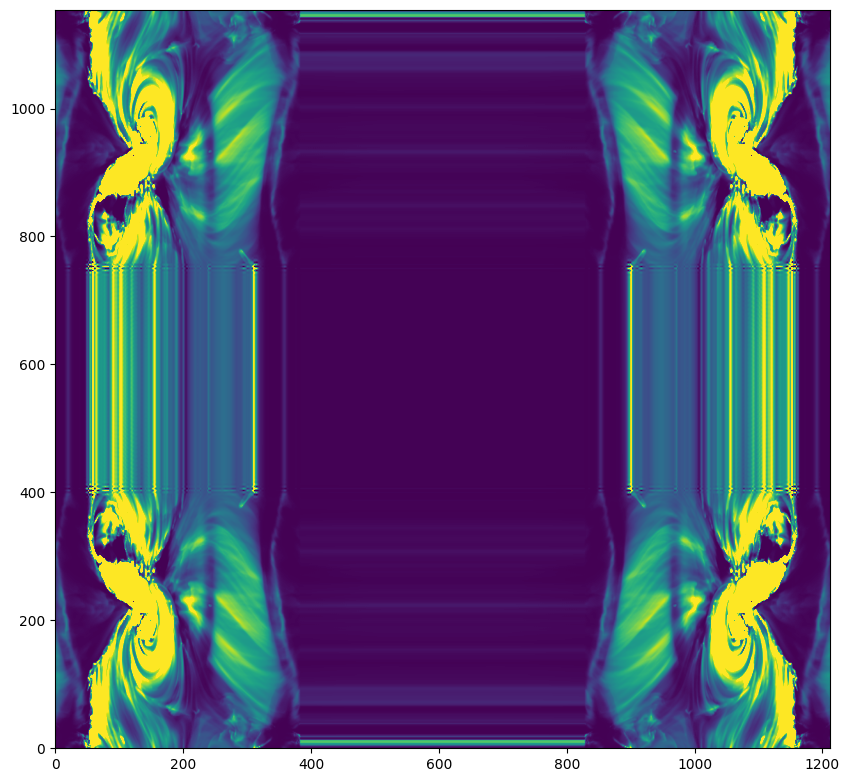

In [959]:
plt.imshow(cc01, vmin=0, vmax=100)
# plt.gca().set(xlim=[0, 10], ylim=[0, 10])
plt.gcf().set_size_inches(10, 10)


In [955]:
cc = cc01[-ay:, -ax:]

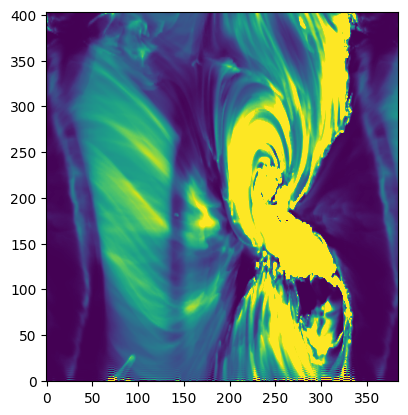

In [956]:
plt.imshow(cc, vmin=0, vmax=100)

In [852]:
bb01[ay:2*ay, :ax] = bb[::-1, :]
bb01[ay:2*ay, ax:2*ax] = bb[::-1, ::-1]
bb01[:ay, ax:2*ax] = bb[:, ::-1]

In [480]:
spec_slit_only_core = exposure_time(muse_spec_only_core.fillna(0), exp_time=exp_time)
spec_slit_only_core.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/spec_slit_only_core.zarr', mode='w')

In [16]:
response.interp(vdop=vdop_inv).fillna(0.0)
vdop = vdop_inv
respsum = sum_lines_per_band(response)
# respsum = ph2dn(respsum, response=response)
# respsum = respsum.swap_dims({'line':'band'})

2025-07-21 15:38:49.146 | INFO     | muse.instr.utils:sum_lines_per_band:1287 - Swapping lines with band was required


In [108]:
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import (
    remove_diffraction_mono, 
    create_xyw_cube, 
    diffraction_removal_from_cube,
    create_spectrum_from_cube)


In [ ]:
spec_diff_removed = remove_diffraction_mono(
    specsum_diff, response, gausslobes_kwarg=kargs, band=specsum_diff.band)

spec_diff_removed.to_zarr(base_path+'/spec_diff_removed', mode='w')

In [ ]:
mom_diff_removed = gaussian_fitting_analysis(
    spec_diff_removed,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})

mom_diff_removed.to_zarr(base_path+'/mom_diff_removed', mode='w')

In [19]:
mom_only_core = gaussian_fitting_analysis(
    specsum_only_core,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_only_core.to_zarr(base_path+'/mom_only_core', mode='w')

In [20]:
mom_diff = gaussian_fitting_analysis(
    specsum_diff,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff.to_zarr(base_path+'/mom_diff', mode='w')

In [21]:
pn = colors.PowerNorm(0.3)

In [22]:
from muse.instr.detect_sidelobes import gl_dist
gl_dist(specsum_diff.line_wvl, lpi=5, arcsec=True)

<xarray.DataArray 'line_wvl' (band: 3)>
array([0.43995715, 0.69461298, 1.15379579])
Coordinates:
    line_wvl  (band) float64 108.4 171.1 284.2
    gain      (band) int64 10 10 10
  * band      (band) int64 108 171 284

In [178]:
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import mono_image, diffraction_removal_in_2d
aa = mono_image(specsum_diff, response)


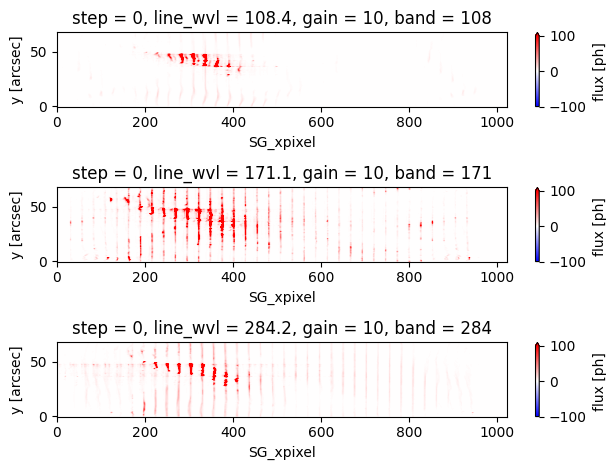

In [120]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_diff - specsum_only_core).flux.isel(band=i, step=0)\
        .plot(vmin=-1e2, vmax=1e2, cmap='bwr', ax=ax[i])
plt.tight_layout()    

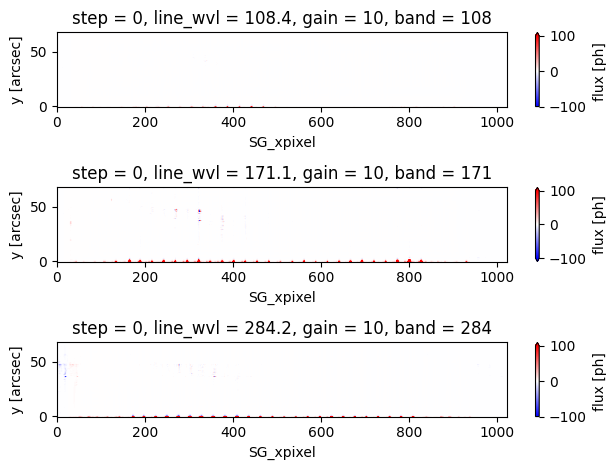

In [121]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (spec_diff_removed - specsum_only_core).flux.isel(band=i, step=0)\
        .plot(vmin=-1e2, vmax=1e2, cmap='bwr', ax=ax[i])
plt.tight_layout()    

In [25]:
print(specsum_diff.flux.attrs)
print(specsum_only_core.flux.attrs)
print(spec_diff_removed.flux.attrs)
print(respsum.SG_resp.attrs)

{'units': 'ph', 'exp_time': 0.6}
{'units': 'ph', 'exp_time': 0.6}
{'units': 'ph', 'exp_time': 0.6}
{'units': '1e-27 cm5 ph / s'}


In [26]:
vdem_inv = vdem_solve(
    specsum_diff,
    respsum, 
    model=model,
)
vdem_inv.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/vdem_specsum_diff.zarr', mode='w')

2025-07-21 15:46:40.042 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (3072, 98980)
2025-07-21 15:46:40.042 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (3072, 4444)


100%|██████████████████████████████████████████████████████████████████████████████| 4444/4444 [26:46:13<00:00, 21.69s/it]

2025-07-22 18:32:55.593 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: ph
2025-07-22 18:32:55.594 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 ph / s
2025-07-22 18:32:55.595 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [27]:
vdem_inv = vdem_solve(
    specsum_only_core,
    respsum, 
    model=model,
)
vdem_inv.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/vdem_specsum_only_core.zarr', mode='w')

2025-07-22 18:33:02.028 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (3072, 98980)
2025-07-22 18:33:02.029 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (3072, 4444)


100%|██████████████████████████████████████████████████████████████████████████████| 4444/4444 [19:54:42<00:00, 16.13s/it]

2025-07-23 14:27:46.780 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: ph
2025-07-23 14:27:46.781 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 ph / s
2025-07-23 14:27:46.782 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [122]:
vdem_inv = vdem_solve(
    spec_diff_removed,
    respsum, 
    model=model,
)
vdem_inv.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/vdem_spec_diff_removed.zarr', mode='w')

2025-07-24 15:56:24.178 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (3072, 98980)
2025-07-24 15:56:24.179 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (3072, 4444)


100%|██████████████████████████████████████████████████████████████████████████████| 4444/4444 [19:17:55<00:00, 15.63s/it]

2025-07-25 11:14:21.158 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: ph
2025-07-25 11:14:21.159 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 ph / s
2025-07-25 11:14:21.160 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [29]:
base_path = '/Users/khcho/MUSE/diffraction/555LPI_test'

mom_gt = gaussian_fitting_analysis(
    spec_gt,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
mom_gt.to_zarr(base_path+'/mom_gt', mode='w')

python(2577) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2578) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2579) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2580) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2581) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2582) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2583) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2584) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2585) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2586) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2587) MallocStackLoggin

In [482]:
base_path = '/Users/khcho/MUSE/diffraction/555LPI_test'

mom_slit_only_core = gaussian_fitting_analysis(
    spec_slit_only_core,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
mom_slit_only_core.to_zarr(base_path+'/mom_slit_only_core', mode='w')

python(96187) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96188) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96189) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96190) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96191) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96192) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96193) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96194) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96195) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96196) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(96198) Malloc

In [30]:
vdem_diff_inv = xr.open_zarr(base_path+'/vdem_specsum_diff.zarr').compute()
spec_diff_inv = vdem_synthesis(vdem_diff_inv, response, sum_over=["logT", "vdop"])
spec_diff_inv = exposure_time(spec_diff_inv, exp_time)
# spec_diff_inv = ph2dn(spec_diff_inv, response) 
spec_diff_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_sub_cont = sub_contaminants(specsum_diff, spec_diff_inv)
mom_diff_inv = gaussian_fitting_analysis(
    spec_diff_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_inv.to_zarr(base_path+'/mom_diff_inv', mode='w')

mom_diff_sub_cont = gaussian_fitting_analysis(
    spec_diff_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_inv["velocity"],
                "serial": serial_gfat})
mom_diff_sub_cont.to_zarr(base_path+'/mom_diff_sub_cont', mode='w')

2025-07-24 07:31:52.372 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


python(2751) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2752) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2753) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2754) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2755) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2756) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2757) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2758) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2759) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2760) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(2761) MallocStackLoggin

In [31]:
vdem_only_core_inv = xr.open_zarr(base_path+'/vdem_specsum_only_core.zarr').compute()
spec_only_core_inv = vdem_synthesis(vdem_only_core_inv, response, sum_over=["logT", "vdop"])
spec_only_core_inv = exposure_time(spec_only_core_inv, exp_time)
# spec_only_core_inv = ph2dn(spec_only_core_inv, response) 
spec_only_core_inv['flux'].attrs['exp_time'] = exp_time
spec_only_core_sub_cont = sub_contaminants(specsum_only_core, spec_only_core_inv)
mom_only_core_inv = gaussian_fitting_analysis(
    spec_only_core_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_only_core_inv.to_zarr(base_path+'/mom_only_core_inv', mode='w')

mom_only_core_sub_cont = gaussian_fitting_analysis(
    spec_only_core_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_only_core_inv["velocity"],
                "serial": serial_gfat})
mom_only_core_sub_cont.to_zarr(base_path+'/mom_only_core_sub_cont', mode='w')

2025-07-24 07:37:00.408 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


python(3107) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3108) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3109) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3110) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3111) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3112) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3113) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3114) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3115) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3116) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(3117) MallocStackLoggin

In [123]:
vdem_diff_removed_inv = xr.open_zarr(base_path+'/vdem_spec_diff_removed.zarr').compute()
spec_diff_removed_inv = vdem_synthesis(vdem_diff_removed_inv, response, sum_over=["logT", "vdop"])
spec_diff_removed_inv = exposure_time(spec_diff_removed_inv, exp_time)
# spec_diff_removed_inv = ph2dn(spec_diff_removed_inv, response) 
spec_diff_removed_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_removed_sub_cont = sub_contaminants(spec_diff_removed, spec_diff_removed_inv)
mom_diff_removed_inv = gaussian_fitting_analysis(
    spec_diff_removed_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_removed_inv.to_zarr(base_path+'/mom_diff_removed_inv', mode='w')

mom_diff_removed_sub_cont = gaussian_fitting_analysis(
    spec_diff_removed_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_removed_inv["velocity"],
                "serial": serial_gfat})
mom_diff_removed_sub_cont.to_zarr(base_path+'/mom_diff_removed_sub_cont', mode='w')

2025-07-25 11:14:51.919 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


python(17166) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17167) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17168) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17169) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17170) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17171) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17172) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17173) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17174) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17175) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(17176) Malloc

In [483]:
from datetime import datetime
from dateutil.tz import gettz
from pathlib import Path
import json

def serialize_model(model):
    """
    Serialize a model to a dictionary.

    Args:
        model (object): The model to be serialized.

    Returns
    -------
        dict: The serialized model.
    """
    if model is None:
        return None
    return {
        "class": model.__module__ + "." + model.__class__.__name__,
        "parameters": model.get_params(),
    }

def plot_from_moment(
    mom_gt, 
    mom_inv, 
    spec_obs, 
    spec_inv, 
    *,
    gt_title='',
    cont_title='', 
    model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr",
    resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/",
    resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/",
    FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/",
    effect_area_108="effective_area_band_108_JMS_2024-10-31.zarr",
    effect_area_171="effective_area_band_171_JMS_2024-10-31.zarr",
    effect_area_284="effective_area_band_284_JMS_2024-10-31.zarr",
    obs_filename_ci=None,
    obs_filename_sg=None,
    gt_filename_sg=None,
    serial_gfat=False,
    run_SDC=True,
    serial_SDC=True,
    run_mask=None,  # ["gt_vdem", "redundant", "intensity", "data_driven"]
    redundant_mask=None,
    velbin_inv=None,
    tgbin_inv=None,
    ntgbin_inv=None,
    rotate=False,
    saturation=None,
    KEYS=None,  # [None,"middle","bottom", "all"]
    target=None,  # ["QS","AR","FL"]
    jump_pix=None,  # [10,10] Jump in y-axis and t-step
    logT=None,
    vdop=None,
    logT_inv=None,
    vdop_inv=None,
    nslits=35,
    model=None,
    model2=None,
    data_driven_mask_model=None,
    data_driven_mask_keyword=None,
    exp_time=0.1,
    noise=False,
    noise_seed=123456789,
    readoutnoise=2.24,
    compression: int = 1,
    npix=2,
    max_vel=50,
    velocity_range=50,
    velocity_range_gt=None,
    velocity_range_guided=None,
    intensity_scaling=None,  # ["noise", "no_noise", None]
    response_info="0.390/0.780 A",
    line=['Fe IX', 'Fe XV', 'Fe XIX 108.355'], 
    savefigs=True,
    savepath="./",
    save_id="",
    savelogfile="sdc_benchmark.json",
    logger=logger,
    save_output=False,
    save_output_netcdf=False,
    author="JMS",
    appendlog=None,
    disable_pbar=False,
    run_cont_id=False,
    dens_eff=1e9,  # The VDEM could be expanded to include density dependence (and the response function)
    pres_eff=3e15,  # The VDEM could be expanded to include density dependence (and the response function)
    lgtgmin_eff=4.8,
    int_cont_ratio=1e2,
    main_lines_cont=None,
    n_cont_top=20,
    cuda_device=3,
    pad_value=3,
    response_scaling=None,  # "auto", None
    unmask_outliers=True,
    randomizeSVD=True,
    muse_fov_mode="wrap",
    thresholds_ph=None,
    thresholds_dn=None,
    passbands_to_solve=None,
):

    logfile = {}
    logfile["model"] = serialize_model(model)    

    
    mask_gt = masker("auto", mom_gt, line_band_list=line, 
                     thresholds_ph=thresholds_ph, thresholds_dn=thresholds_dn)
    mask_inv = masker(
        "auto", mom_inv, line_band_list=line, thresholds_ph=thresholds_ph, 
        thresholds_dn=thresholds_dn)
    mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)
    outliers = get_outliers_newer(mom_inv, mom_gt, line_band_list=line, mask=mask_all, factor_int=4)
    sigma = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all)
    kargs = {"percentile": 95}
    sigma2 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    kargs = {"percentile": 99.7}
    sigma3 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    full_mask = mask_all.net_flux.sum("line", skipna=True)
    full_mask = xr.where(full_mask > 0, 1, 0)
    outs_full = 0
    for li in line:
        outs_full = outs_full + outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
    outs_full = xr.where(outs_full > 0, 1, 0)
    frac_full = 100 * outs_full.sum(dim=["x", "y"]).values / full_mask.sum(dim=["x", "y"]).values
    logfile[f"Outliers__frac"] = frac_full
    
    WEST = gettz("US/Western")
    reapname = f"{FeXIX_108_resp[19:-20]}"
    
    # plotting
    suptitle_string = {}
    modelname = model_name.split("/")[-1][:-5] if model_name is not None else obs_filename_sg.split("/")[-1][:-5]
    
    # Make modelname shorter (or will be too long for the filename):
    model_parts = modelname.split("_")
    reap_parts = reapname.split("_")
    unique_model_parts = [part for part in model_parts if part not in reap_parts]
    modelname = "_".join(unique_model_parts)
    spec_inv_muse = sum_lines_slits_per_band(spec_inv)
    Chi_error_ystep = np.abs(spec_inv_muse.flux - spec_obs.flux).sum(dim=["y", "SG_xpixel", "step"])
    for li in line:
        out_mu_sigma = outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
        out_mu_sigma = xr.where(out_mu_sigma > 0, 1, 0)
        frac = (
            100
            * out_mu_sigma.sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"Outliers__frac_{li}"] = frac
        logfile[f"outliers__frac_{li}_net_flux"] = (
            100
            * outliers[li]["net_flux"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_velocity"] = (
            100
            * outliers[li]["velocity"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_linewidth"] = (
            100
            * outliers[li]["linewidth"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        for ivars in ["net_flux", "velocity", "linewidth"]:
            logfile[f"sigma1__frac_{li}_{ivars}"] = sigma[li][ivars]
            logfile[f"sigma2__frac_{li}_{ivars}"] = sigma2[li][ivars]
            logfile[f"sigma3__frac_{li}_{ivars}"] = sigma3[li][ivars]
        kband = mom_inv.band.sel(line=li)
        if run_SDC:
            suptitle_string[li] = (
                f"{logfile['model']['class'].split('.')[-1]}, {logfile['model']['parameters']['alpha']:.1e}, {logfile['model']['parameters']['fit_intercept']}, Abs. error {Chi_error_ystep.sel(band=kband).data:.2e} \n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
        else:
            suptitle_string[li] = (
                f"\n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
    plot_with_chisquare(
        mom_inv,
        mom_gt,
        line,
        mask_obs=mask_inv,
        mask_gt=mask_gt,
        mask_all=mask_all,
        response=response_info,
        xaxis_gt=True,
        max_vel=max_vel,
        min_vel=-max_vel,
        suptitle_string=suptitle_string,
        save_id=f"GFAT_sub_{save_id}_GTnoise_{exp_time}sec__{modelname}_{reapname}_{author}_{datetime.now(WEST).date()!s}",
        savepath=savepath,
        outliers=outliers,
        cont_title=cont_title,
        gt_title=gt_title,
        sigmas=[sigma, sigma2, sigma3],
    )
    
    with (Path(savepath) / savelogfile).open("w") as fp:
        keys_to_remove = []
        for key in logfile:
            try:
                json.dumps(logfile[key])
            except (TypeError, OverflowError):
                logger.info(f"Key: {key} is not JSON serializable and will be removed from the logfile")
                keys_to_remove.append(key)
        for key in keys_to_remove:
            logfile.pop(key)
        json.dump(logfile, fp, indent=4)

In [484]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff, 
    specsum_diff, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_diff', 
    save_id = 'diff',  
    cont_title = 'diff', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:52:40.575 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff/FeIX_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:52:54.247 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff/FeXV_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:53:07.316 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff/FeXIX108.355_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png


In [485]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_inv, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv', 
    save_id = 'diff_inv',  
    cont_title = 'diff inv', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:53:54.264 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv/FeIX_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:54:08.209 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv/FeXV_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:54:21.939 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv/FeXIX108.355_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png


In [486]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_sub_cont, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv_sub_cont', 
    save_id = 'diff_inv_sub_cont',  
    cont_title = 'diff inv sub_cont', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:54:55.170 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv_sub_cont/FeIX_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:55:08.400 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv_sub_cont/FeXV_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:55:21.583 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-

In [487]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core, 
    specsum_only_core, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_only_core', 
    save_id = 'only_core',  
    cont_title = 'only core', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:55:53.609 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core/FeIX_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:56:06.685 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core/FeXV_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:56:19.852 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core/FeXIX108.355_map_GFAT_sub_only_core_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png


In [488]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core_inv, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv', 
    save_id = 'only_core_inv',  
    cont_title = 'only core inv', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:57:05.891 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv/FeIX_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:57:18.865 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv/FeXV_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:57:31.803 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv/FeXIX108.355_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png


In [489]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core_sub_cont, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv_sub_cont', 
    save_id = 'only_core_inv_sub_cont',  
    cont_title = 'only_core inv sub_cont', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:58:04.844 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv_sub_cont/FeIX_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:58:18.347 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv_sub_cont/FeXV_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:58:31.151 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_only_core_inv_sub_cont/FeXIX108.355_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chia

In [490]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed, 
    spec_diff_removed, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_diff_removed', 
    save_id = 'diff_removed',  
    cont_title = 'diff removed', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 14:59:01.936 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed/FeIX_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:59:16.956 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed/FeXV_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 14:59:30.230 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed/FeXIX108.355_map_GFAT_sub_diff_removed_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png


In [491]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed_inv, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv', 
    save_id = 'diff_removed_inv',  
    cont_title = 'diff removed inv', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 15:00:15.421 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv/FeIX_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 15:00:28.343 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv/FeXV_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 15:00:41.108 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv/FeXIX108.355_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png

In [492]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed_sub_cont, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv_sub_cont', 
    save_id = 'diff_removed_inv_sub_cont',  
    cont_title = 'diff removed inv sub cont', 
    gt_title = "No noise only core",
    model = model) 


2025-07-30 15:01:14.716 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv_sub_cont/FeIX_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 15:01:27.822 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv_sub_cont/FeXV_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-07-30.png
2025-07-30 15:01:41.015 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_test/plot_diff_removed_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390

In [95]:
spec_diff_removed_inv.swap_dims({'line':'band'}).sel(band=spec_diff_removed_inv.band[0])

<xarray.Dataset>
Dimensions:    (slit: 35, step: 11, y: 404, band: 3, SG_xpixel: 1024)
Coordinates:
  * slit       (slit) int64 0 1 2 3 4 5 6 7 8 9 ... 26 27 28 29 30 31 32 33 34
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl   (band) float64 108.4 108.1 108.4
    gain       (band) int64 10 10 10
    band       (band) int64 108 108 108
    line       (band) <U23 'Fe XIX 108.355' 'Fe XXI' '[108] missing main line'
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
Data variables:
    flux       (slit, step, y, band, SG_xpixel) float32 0.0 0.0 ... 0.009628
    SG_wvl     (band, slit, SG_xpixel) float64 107.7 107.7 107.7 ... 109.4 109.5
Attributes:
    Chianti version:  10.1
    HISTORY:          ['create_resp_func_nullvel(line_list=line_list, instr_w...
    RESP_HISTORY:     ['create_resp_func_nullvel(line_list=line_list, instr_w...
    SPEC_HISTORY:     ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     29-Oct-2024
    date modified:    17-Jul-2025
    flux units:       ph/s
    step_size:        0.4010416666666667
    step_size units:  arcsec
    version:          0.2.dev6+g6505469

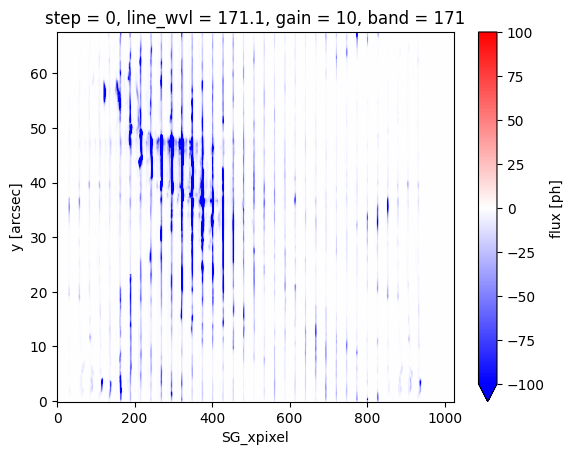

In [76]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = specsum_diff.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

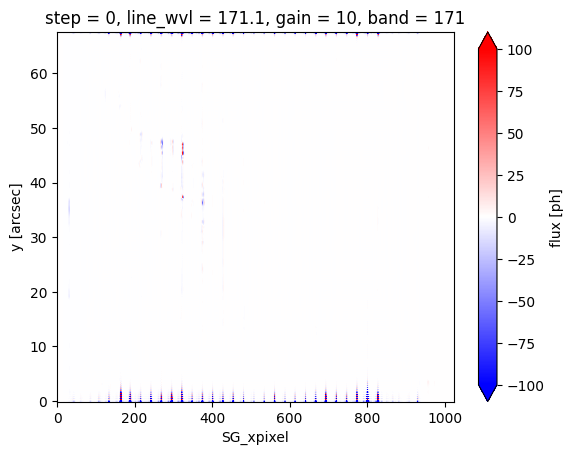

In [110]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = spec_diff_removed.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

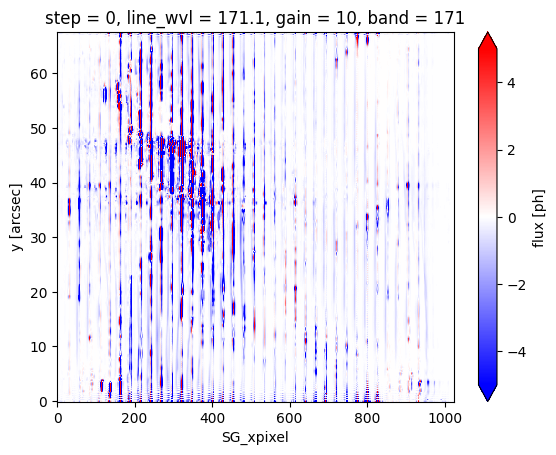

In [111]:
band = spec_diff_removed.band[1]
aa = spec_diff_removed.flux.sel(band=band)
bb = spec_diff_removed_inv.flux.swap_dims({'line':'band'}).sel(band=band).sum(dim=['slit', 'band'])
(aa-bb).isel(step=0).plot(vmin=-5, vmax=5, cmap='bwr')

In [106]:
band=284
np.argmin(np.abs(specsum_diff.band.values - band))

2

In [107]:
specsum_diff.band[2]

<xarray.DataArray 'band' ()>
array(284)
Coordinates:
    line_wvl  float64 284.2
    gain      int64 10
    band      int64 284

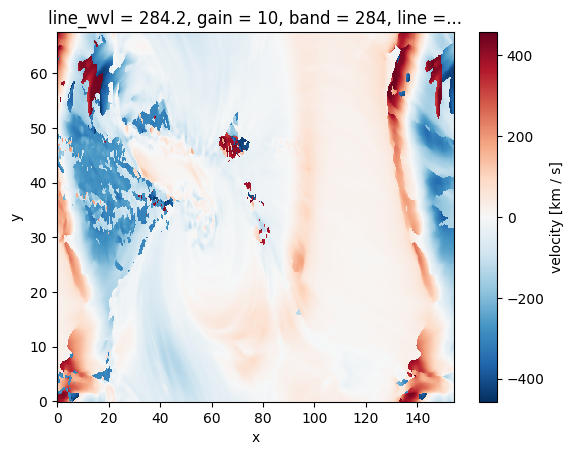

In [79]:
mom_only_core.velocity.isel(line=1).plot()

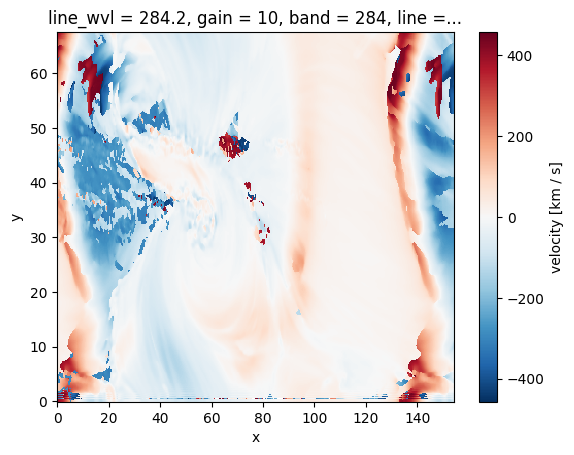

In [81]:
mom_diff_removed.velocity.isel(line=1).plot()

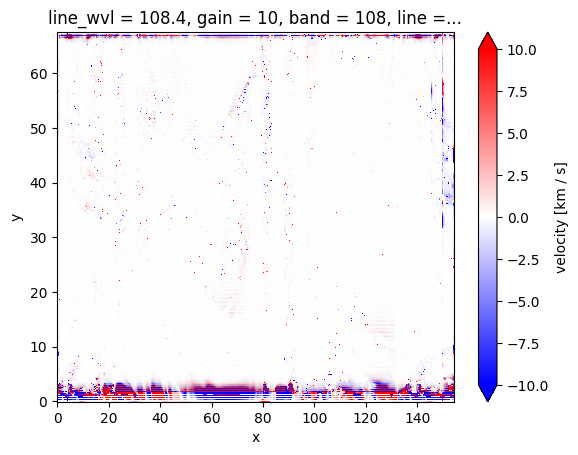

In [310]:
(mom_diff_removed.velocity-mom_only_core.velocity).isel(line=2).plot(vmin=-10, vmax=10, cmap='bwr')

In [ ]:
response = response.interp(vdop=vdop_inv).fillna(0.0)
vdop = vdop_inv

object = specsum_psf
respsum = sum_lines_per_band(response)
vdem_inv = vdem_solve( 
    object,
    respsum,
    model=model,
    serial=serial_SDC,
    response_scaling=response_scaling,
)


2025-07-07 16:43:50.742 | INFO     | muse.instr.utils:sum_lines_per_band:1287 - Swapping lines with band was required
2025-07-07 16:44:00.832 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (3072, 98980)
2025-07-07 16:44:00.833 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (3072, 4444)
2025-07-07 16:44:04.065 | INFO     | muse.inversions.inversions:vdem_solve:759 - R created in shared memory
2025-07-07 16:44:04.094 | INFO     | muse.inversions.inversions:vdem_solve:762 - b created in shared memory
2025-07-07 16:44:04.094 | INFO     | muse.inversions.inversions:vdem_solve:765 - np_mask created in shared memory
2025-07-07 16:44:04.123 | INFO     | muse.inversions.inversions:vdem_solve:768 - np_scaling created in shared memory
2025-07-07 16:44:04.125 | INFO     | muse.inversions.inversions:vdem_solve:788 - Number of tasks: 4444, where 24 cores will process about 185 tasks each.


  0%|                                                                                              | 0/24 [00:00<?, ?it/s]

In [6]:
## generation of MUSE data with diffraction
%%capture cap

try:
    os.mkdir(save_path)
except:
    pass
output_list_cheating = bench_diff(
    model_path=dpth_vdem_m_flare,
    model_name='muse_vdem_m-flare-muram_los2_trac_fixedvdop_JMS_2May2025_555806.zarr',
    resp_path_sg=dpth_resp+'response_functions_with_slits/',
    # resp_path_ci=dpth_resp+'response_functions_CI/',
    resp_path_ci=None, 
    FeXIX_108_resp=FeXIX_108_resp,
    FeXXI_108_resp=FeXXI_108_resp,
    contam_108_resp=contam_108_resp,
    FeIX_171_resp=FeIX_171_resp,
    contam_171_resp=contam_171_resp,
    FeXV_284_resp=FeXV_284_resp,
    contam_284_resp=contam_284_resp,
    # ci_195_resp=ci_195_resp,
    ci_195_resp=None,
    #velbin_inv=5, #[5,10,15,20,30]
    vdop = np.arange(-500,510,10),   #controls VDEM and Response Functions (no noise exp.)
    vdop_inv = np.arange(-500,510,10), #controls only Response Functions in the inversions (fixed, no noise exp.)

    velocity_range = 80, 
    velocity_range_guided = 400, 

    run_SDC=False,
    serial_SDC=False,
    exp_time=0.6,    #noise exp: 0.1,0.6,1.8 s
    obs_filename_ci=None,
    obs_filename_sg=None,
    gt_filename_sg=None,
    syn_path="./",
    KEYS=['all'],
    # jump_pix = [16, 16], 
    line=['Fe IX', 'Fe XV', 'Fe XIX 108.355'],
    intensity_scaling="no_noise",
    model = Lasso(alpha=1e-1, positive=True, fit_intercept=False, max_epochs=500), 
    run_mask = None, 
    savefigs=True,
    savepath=save_path,
    noise = True,   #noise exp
    save_output = True,
    save_id=f'no_mask1', 
    )
plt.close()

2025-07-07 15:15:55.514 | INFO     | benchmark_diffraction:sdc_benchmark:614 - ---------------------------------
2025-07-07 15:15:55.516 | INFO     | benchmark_diffraction:sdc_benchmark:615 - LOCAL INPUTS:
2025-07-07 15:15:55.518 | INFO     | benchmark_diffraction:sdc_benchmark:619 - model_path : /net/triad/Volumes/Space/MUSE_GCP/muse_vdems/vdems_models/m_flare_muram_trac/
2025-07-07 15:15:55.519 | INFO     | benchmark_diffraction:sdc_benchmark:619 - model_name : muse_vdem_m-flare-muram_los2_trac_fixedvdop_JMS_2May2025_555806.zarr
2025-07-07 15:15:55.520 | INFO     | benchmark_diffraction:sdc_benchmark:619 - resp_path_sg : /net/triad/Volumes/Space/MUSE_GCP/muse_response_function/Base_line/response_functions_with_slits/
2025-07-07 15:15:55.520 | INFO     | benchmark_diffraction:sdc_benchmark:619 - resp_path_ci : None
2025-07-07 15:15:55.521 | INFO     | benchmark_diffraction:sdc_benchmark:619 - FeXIX_108_resp : respfunc_108_fe_19_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_p

KeyboardInterrupt: 

In [6]:
pdb.pm()

> /Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/xarray/core/indexing.py(235)expanded_indexer()
    233             new_key.append(k)
    234     if len(new_key) > ndim:
--> 235         raise IndexError("too many indices")
    236     new_key.extend((ndim - len(new_key)) * [slice(None)])
    237     return tuple(new_key)



ipdb>  u


> /Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/xarray/core/dataarray.py(840)_item_key_to_dict()
    838         if utils.is_dict_like(key):
    839             return key
--> 840         key = indexing.expanded_indexer(key, self.ndim)
    841         return dict(zip(self.dims, key))
    842 



ipdb>  u


> /Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/xarray/core/dataarray.py(859)__getitem__()
    857         else:
    858             # xarray-style array indexing
--> 859             return self.isel(indexers=self._item_key_to_dict(key))
    860 
    861     def __setitem__(self, key: Any, value: Any) -> None:



ipdb>  u


> /Users/khcho/Git/muse/muse/instr/utils.py(1386)sum_lines_slits_per_band()
   1384             line_wvl_list.append(spec.line_wvl[kk])
   1385             if "gain" in spec.coords:
-> 1386                 gain_list.append(spec.gain[kk])
   1387 
   1388     for ik, k in enumerate(band_list):



ipdb>  spec.gain


<xarray.DataArray 'gain' ()>
array(10)
Coordinates:
    gain     int64 10


ipdb>  spec


<xarray.Dataset>
Dimensions:    (slit: 35, step: 11, y: 404, SG_xpixel: 1024, band: 3)
Coordinates:
  * slit       (slit) int64 0 1 2 3 4 5 6 7 8 9 ... 26 27 28 29 30 31 32 33 34
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
    line_wvl   (band) float64 108.4 171.1 284.2
    gain       int64 10
  * band       (band) int64 108 171 284
Data variables:
    flux       (band, slit, step, y, SG_xpixel) float64 0.001947 ... 0.002579
    SG_wvl     (band, slit, SG_xpixel) float64 107.7 107.7 107.7 ... 286.5 286.6
Attributes:
    Chianti version:  10.1
    HISTORY:          ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     06-Nov-2024
    date modified:    03-Jul-2025
    version:          0.2.dev6+g6505469
    step_size:        0.4010416666666667
    ste

ipdb>  u


> /Users/khcho/MUSE/diffraction/555LPI_test/benchmark_diffraction.py(1143)sdc_benchmark()
   1141 
   1142     muse_spec_psf, resp = muse_interp_xyw2rssg(spec_with_psf,response, line=response.line[[0, 3, 5]])
-> 1143     specsum_psf = sum_lines_slits_per_band(muse_spec_psf)
   1144     specsum_psf.to_zarr('/Users/khcho/MUSE/diffraction/555LPI_test/specsum_psf.zarr', mode='w')
   1145 



ipdb>  muse_spec_psf


<xarray.Dataset>
Dimensions:    (slit: 35, step: 11, y: 404, SG_xpixel: 1024, band: 3)
Coordinates:
  * slit       (slit) int64 0 1 2 3 4 5 6 7 8 9 ... 26 27 28 29 30 31 32 33 34
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
    line_wvl   (band) float64 108.4 171.1 284.2
    gain       int64 10
  * band       (band) int64 108 171 284
Data variables:
    flux       (band, slit, step, y, SG_xpixel) float64 0.001947 ... 0.002579
    SG_wvl     (band, slit, SG_xpixel) float64 107.7 107.7 107.7 ... 286.5 286.6
Attributes:
    Chianti version:  10.1
    HISTORY:          ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     06-Nov-2024
    date modified:    03-Jul-2025
    version:          0.2.dev6+g6505469
    step_size:        0.4010416666666667
    ste

ipdb>  spec_with_psf


<xarray.Dataset>
Dimensions:    (band: 3, y: 404, x: 385, SG_xpixel: 2048)
Coordinates:
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
  * x          (x) float64 0.0 0.401 0.8021 1.203 ... 152.8 153.2 153.6 154.0
  * SG_xpixel  (SG_xpixel) float64 0.0 1.0 2.0 ... 2.045e+03 2.046e+03 2.047e+03
    line_wvl   (band) float64 108.4 171.1 284.2
    gain       (band) int64 10 10 10
  * band       (band) int64 108 171 284
Data variables:
    flux       (x, y, band, SG_xpixel) float32 3.018e-09 3.112e-09 ... 3.712e-06
    SG_wvl     (band, SG_xpixel) float64 95.2 95.22 95.23 ... 311.5 311.5 311.5
Attributes:
    Chianti version:  10.1
    HISTORY:          ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     06-Nov-2024
    date modified:    03-Jul-2025
    version:          0.2.dev6+g6505469
    step_size:        0.4010416666666667
    step_size units:  arcsec


ipdb>  q


In [10]:
spec_gt = xr.open_zarr(save_path+'/specsum_gt.zarr').compute()

In [11]:
spec_only_core = xr.open_zarr(save_path+'/specsum_only_core.zarr').compute()

In [7]:
spec_diff = xr.open_zarr(save_path+'/specsum_psf.zarr').compute()

In [9]:
spec_diff.flux

<xarray.DataArray 'flux' (band: 3, step: 11, y: 404, SG_xpixel: 1024)>
array([[[[4.74644121e-03, 4.56047556e-03, 5.19402264e-03, ...,
          1.59726420e-03, 1.85158019e-03, 2.56123071e-03],
         [7.00555536e-03, 6.75509995e-03, 7.62027930e-03, ...,
          2.21784577e-03, 2.53961313e-03, 3.45440839e-03],
         [9.05266772e-03, 8.80458975e-03, 9.74831309e-03, ...,
          2.68708702e-03, 2.99072966e-03, 3.88973447e-03],
         ...,
         [4.05557093e-03, 4.04649985e-03, 4.76230987e-03, ...,
          2.69068673e-03, 3.09892795e-03, 4.26177941e-03],
         [4.14074933e-03, 4.03189975e-03, 4.59911090e-03, ...,
          2.21939199e-03, 2.62527070e-03, 3.68750551e-03],
         [3.42166572e-03, 3.28962151e-03, 3.64404647e-03, ...,
          1.54821657e-03, 1.86531480e-03, 2.66048068e-03]],

        [[5.09277988e-03, 5.11605937e-03, 5.99835256e-03, ...,
          1.73944619e-03, 1.98771601e-03, 2.65280141e-03],
         [7.56627566e-03, 7.40661646e-03, 8.62531750e-03, ...,
          2.51208949e-03, 2.79139602e-03, 3.60158011e-03],
         [9.97722889e-03, 9.53220625e-03, 1.09026701e-02, ...,
          3.10686917e-03, 3.33019482e-03, 4.05267604e-03],
...
         [4.94982890e-01, 7.97041550e-01, 1.04094013e+00, ...,
          1.07520309e-01, 1.29558545e-01, 1.19512990e-01],
         [4.42437710e-01, 7.02363690e-01, 9.12444385e-01, ...,
          9.43766778e-02, 1.12805038e-01, 1.03387504e-01],
         [3.28560287e-01, 5.25426219e-01, 6.86865133e-01, ...,
          6.82569958e-02, 8.10935213e-02, 7.40621030e-02]],

        [[2.90353522e-01, 4.62081787e-01, 6.27537036e-01, ...,
          5.82548680e-02, 6.71823246e-02, 6.17791982e-02],
         [3.80922579e-01, 5.97251626e-01, 7.89073142e-01, ...,
          7.76355390e-02, 9.00369314e-02, 8.40826944e-02],
         [4.22463886e-01, 6.65158829e-01, 8.51712914e-01, ...,
          8.58405300e-02, 1.00602818e-01, 9.65886525e-02],
         ...,
         [5.63152542e-01, 8.14088701e-01, 1.03488773e+00, ...,
          1.08846703e-01, 1.32382796e-01, 1.21023549e-01],
         [4.83247566e-01, 7.10916273e-01, 9.11077728e-01, ...,
          9.58518656e-02, 1.15472092e-01, 1.04805692e-01],
         [3.43243748e-01, 5.14746809e-01, 6.71057242e-01, ...,
          6.95568378e-02, 8.33006345e-02, 7.52960715e-02]]]])
Coordinates:
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
  * band       (band) int64 108 171 284
    gain       (band) int64 10 10 10
    line_wvl   (band) float64 108.4 171.1 284.2
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
Attributes:
    units:    ph / s

In [13]:
from matplotlib import colors

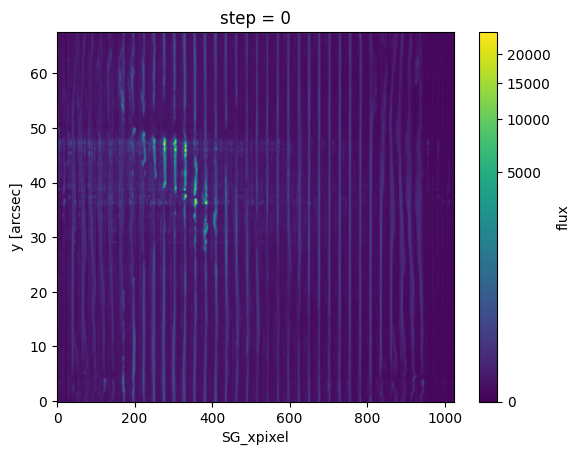

In [14]:
aa = spec_gt.sel(line=spec_gt.line[5:]).sum(dim=['slit', 'line']).sel(step=0).flux
aa.plot(norm=colors.PowerNorm(0.3))

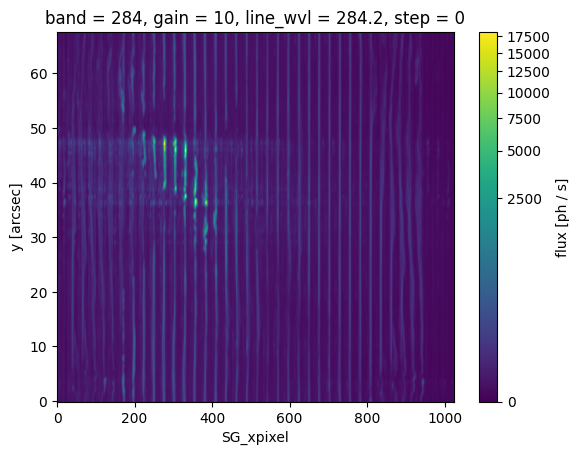

In [15]:
bb = spec_only_core.sel(step=0, band=spec_only_core.band[2]).flux
bb.plot(norm=colors.PowerNorm(0.3))

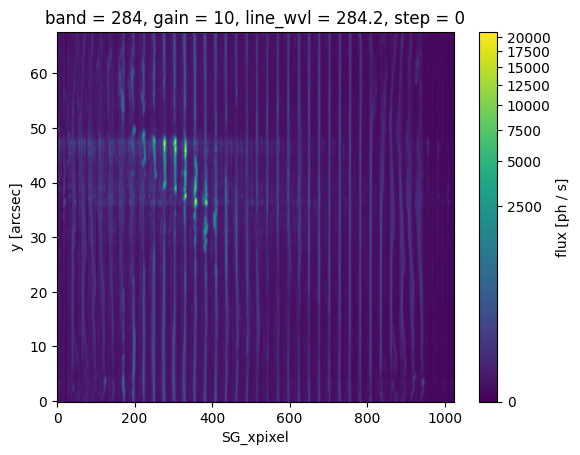

In [16]:
cc = spec_diff.sel(step=0, band=spec_only_core.band[2]).flux
cc.plot(norm=colors.PowerNorm(0.3))

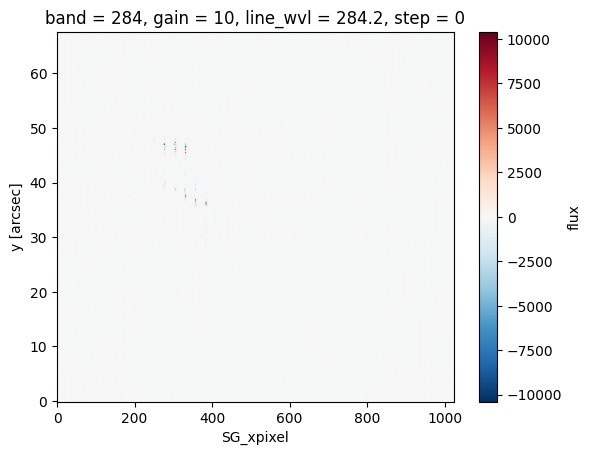

In [17]:
(bb-aa).plot()

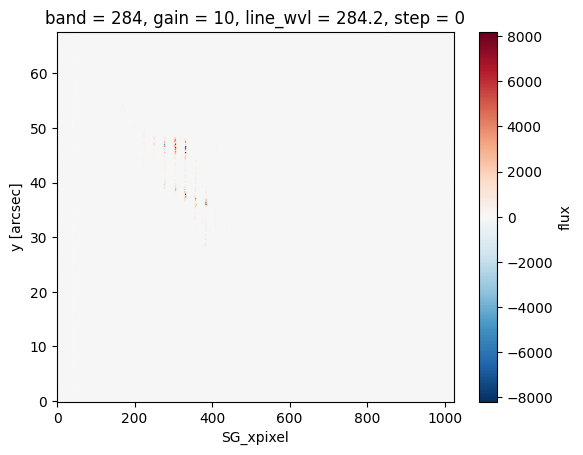

In [18]:
(cc-aa).plot()

In [19]:
spec_diff

<xarray.Dataset>
Dimensions:    (SG_xpixel: 1024, band: 3, step: 11, y: 404)
Coordinates:
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
  * band       (band) int64 108 171 284
    gain       (band) int64 10 10 10
    line_wvl   (band) float64 108.4 171.1 284.2
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
Data variables:
    flux       (band, step, y, SG_xpixel) float64 0.004746 0.00456 ... 0.0753
Attributes:
    Chianti version:  10.1
    HISTORY:          ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     06-Nov-2024
    date modified:    07-Jul-2025
    flux units:       ph/s
    step_size:        0.4010416666666667
    step_size units:  arcsec
    version:          0.2.dev6+g6505469

[(-0.5, 403.5)]

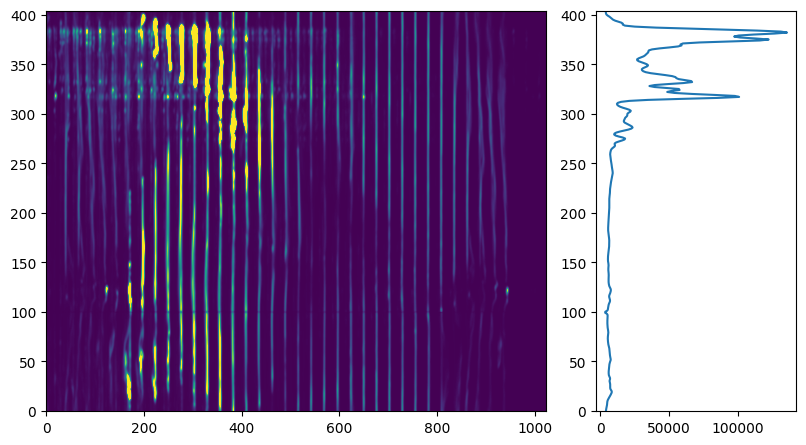

In [305]:
roll=100
fig = plt.figure(figsize=[10, 5])
ax0 = fig.add_axes([0.1, 0.1, 0.5, 0.8])
ax1 = fig.add_axes([0.65, 0.1, 0.2, 0.8])
ax0.imshow(specsum_diff.flux.isel(band=2, step=0).roll(y=roll), vmax=1e2, aspect='auto')
ax1.plot(specsum_diff.flux.isel(band=2, step=0).sum(dim='SG_xpixel').roll(y=roll), np.arange(404))
ax1.set(ylim=ax0.get_ylim())

[(-0.5, 403.5)]

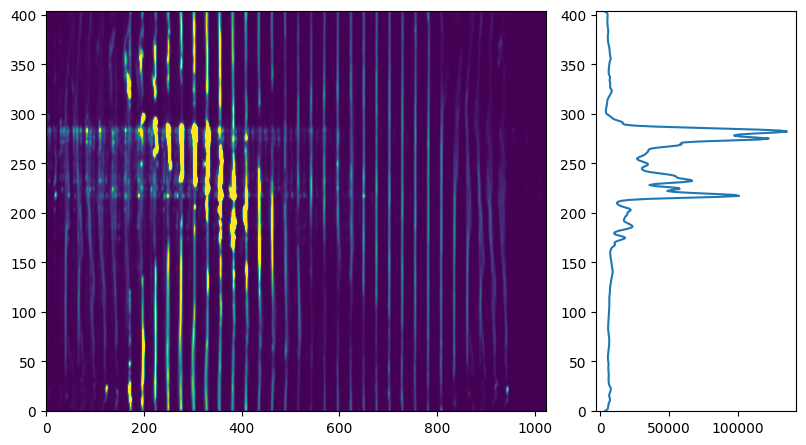

In [306]:
roll=0
fig = plt.figure(figsize=[10, 5])
ax0 = fig.add_axes([0.1, 0.1, 0.5, 0.8])
ax1 = fig.add_axes([0.65, 0.1, 0.2, 0.8])
ax0.imshow(specsum_diff.flux.isel(band=2, step=0).roll(y=roll), vmax=1e2, aspect='auto')
ax1.plot(specsum_diff.flux.isel(band=2, step=0).sum(dim='SG_xpixel').roll(y=roll), np.arange(404))
ax1.set(ylim=ax0.get_ylim())

In [641]:
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import diffraction_removal_in_2d, find_sgx_pixel_from_wavelength

In [319]:
mm = mono_image(specsum_diff, response)

In [475]:
mm0 = mono_image(spec_slit_only_core.fillna(0), response)

In [556]:
mm00 = mono_image(spec_gt.isel(line=[5, 6]).swap_dims({'line':'band'}).fillna(0), response)

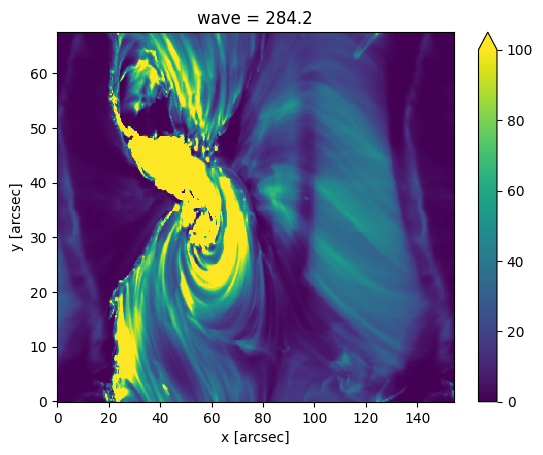

In [558]:
mm00.plot(vmin=0, vmax=100)

In [589]:
image = mm.isel(wave=0)
gausslobes_kwarg = kargs
psf = gausslobes(wavelength=image.wave.data * u.AA, **gausslobes_kwarg, center=False).T
imgy, imgx = image.shape
psfy, psfx = psf.shape
ny = imgy + psfy - 1
nx = imgx + psfx - 1
img_ = np.zeros((ny, nx))
psf_ = np.zeros((ny, nx))
# img_ = image.values
# psf_ = fftpack.fftshift(psf)
img_[:imgy, :imgx] = image.values
psf_[-psfy:, -psfx:] = psf
res = np.real(fftpack.ifftn(img__fft / psf__fft))
# img__fft = fftpack.fftshift(fftpack.fftn(img_))
# psf__fft = fftpack.fftshift(fftpack.fftn(psf_))
# res = np.real((fftpack.ifftn(fftpack.ifftshift(img__fft / psf__fft))))


no_core_psf = res[(ny - psfy + 1) // 2 : (ny - psfy + 1) // 2 + imgy, 
                  (nx - psfx + 1) // 2 : (nx - psfx + 1) // 2 + imgx]

if 'only_core' in gausslobes_kwarg.keys():
    if gausslobes_kwarg['only_core'] != True:
        gl_core = gausslobes(wavelength=image.wave.data * u.AA, only_core=True, **gausslobes_kwarg).T
        with_core_psf = signal.fftconvolve(no_core_psf, gl_core)
        with_core_psf_part = with_core_psf[psfy // 2 : psfy // 2 + imgy, psfx // 2 : psfx // 2 + imgx]
    else:
        with_core_psf_part = no_core_psf
new_img = image.copy(deep=True)
new_img.data = with_core_psf_part

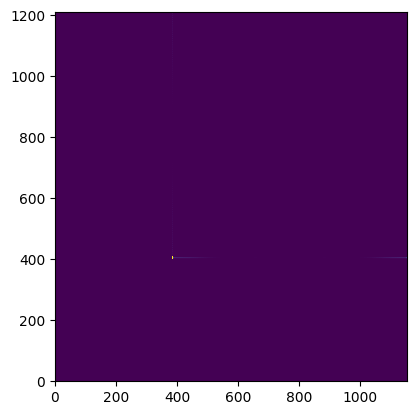

In [590]:
plt.imshow(psf_, vmin=0, vmax=1e-4)

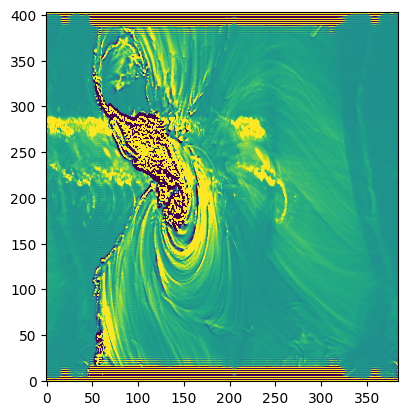

In [564]:
plt.imshow(no_core_psf - mm0.isel(wave=0).values, vmin=-10, vmax=10)

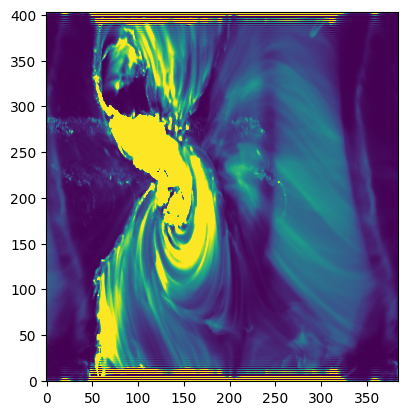

In [562]:
plt.imshow(no_core_psf, vmin=0, vmax=100)

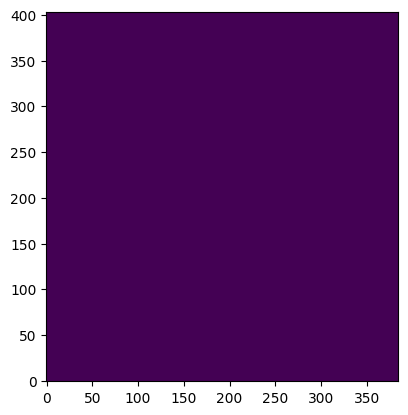

In [551]:
aaa = res[psfy-1:psfy-1+imgy, psfx-1:psfx-1+imgx]
plt.imshow(aaa, vmin=0, vmax=100)

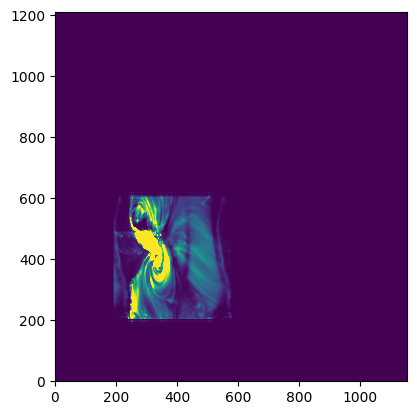

In [549]:
plt.imshow(res, vmin=0, vmax=100)

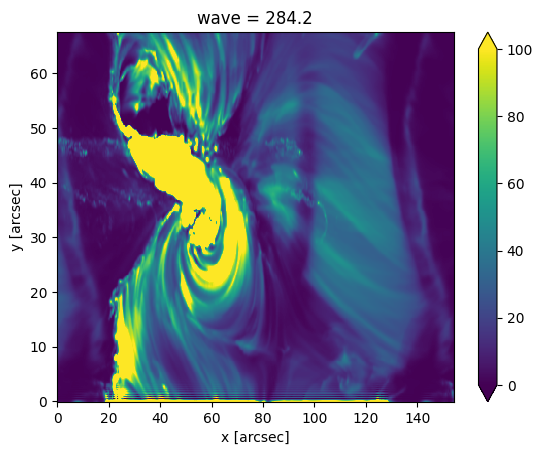

In [528]:
new_img.plot(vmin=0, vmax=100)

In [525]:
mm00 = diffraction_removal_in_2d(mm.isel(wave=0), 
                                 gausslobes_kwarg={'oversample_x': 3,
 'slit_dim': 404,
 'lpi': 5,
 'fwhm': 0.5,
 'transmission': 0.97, 
                                 'only_core':True})

NameError: name 'asdf' is not defined

> /Users/khcho/Git/muse/muse/instr/mono_diffraction.py(239)diffraction_removal_in_2d()
    237     new_img = image.copy(deep=True)
    238     new_img.data = with_core_psf_part
--> 239     asdf
    240     return xr.where(new_img < 0, 0, new_img)
    241 



ipdb>  plt.imshow(res, vmax=100, vmin=0) ; plt.show()


*** NameError: name 'plt' is not defined


ipdb>  import matplotlib.pyplot as plt
ipdb>  plt.imshow(res, vmax=100, vmin=0) ; plt.show()


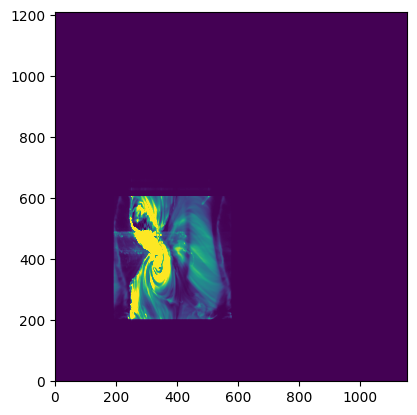

ipdb>  plt.imshow(no_core_psf, vmax=100, vmin=0) ; plt.show()


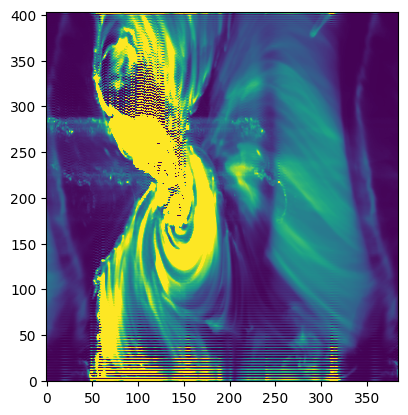

ipdb>  plt.imshow(res, vmax=100, vmin=0) ; plt.gca().set(xlim=[200, 600], ylim=[200, 600]) ; plt.show()


[(200.0, 600.0), (200.0, 600.0)]


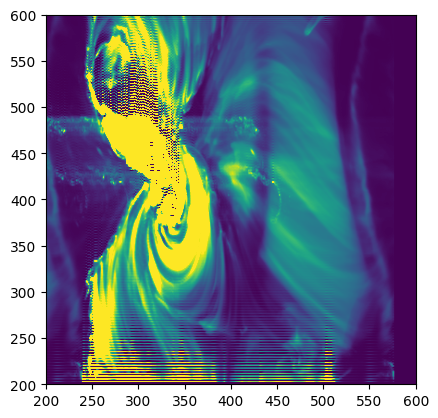

ipdb>  q


In [520]:
pdb.pm()

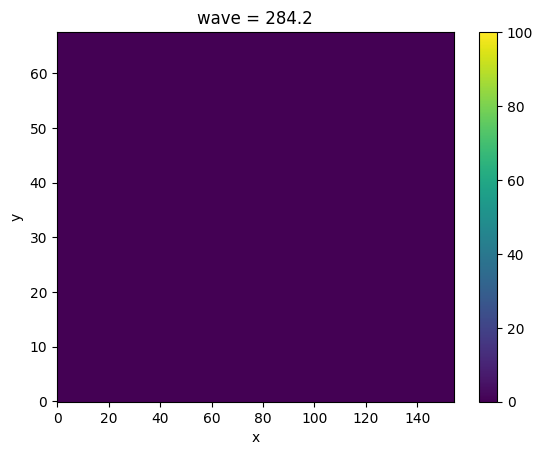

In [514]:
mm00.plot(vmax=100)

In [500]:
'only_core' in kargs.keys()

False

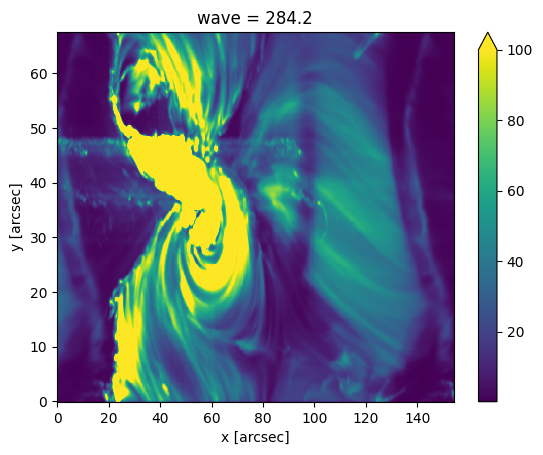

In [321]:
mm.plot(vmax=100)

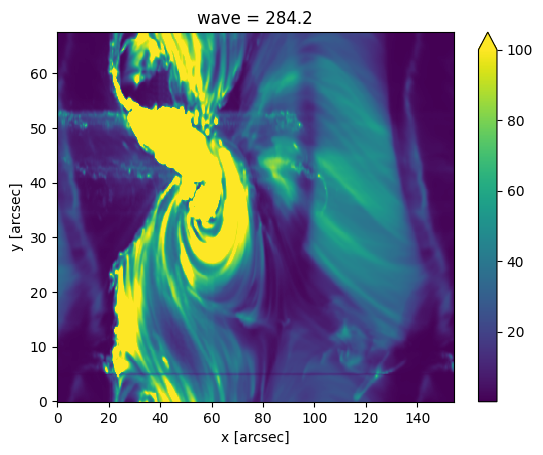

In [323]:
mm.roll(y=30).plot(vmax=100)

In [418]:
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import diffraction_removal_in_2d

In [419]:
mm0 = diffraction_removal_in_2d(mm.isel(wave=0), gausslobes_kwarg=kargs)
mm0.plot(vmax=100)

NameError: name 'asdf' is not defined

> /Users/khcho/Git/muse/muse/instr/mono_diffraction.py(239)diffraction_removal_in_2d()
    237     new_img = image.copy(deep=True)
    238     new_img.data = with_core_psf_part
--> 239     asdf
    240     return xr.where(new_img < 0, 0, new_img)
    241 



ipdb>  import matplotlib.pyplot as plt
ipdb>  plt.imshow(with_core_psf_part, vmax=100) ; plt.show()


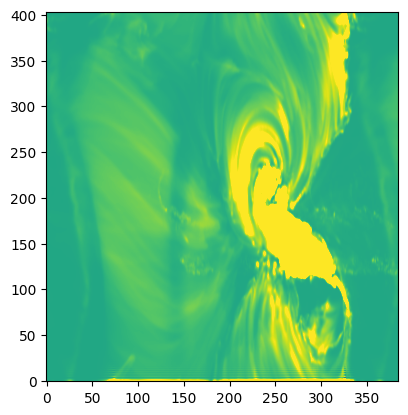

ipdb>  with_core_psf_part = with_core_psf[psfy // 2 : psfy // 2 + imgy*nm, psfx // 2 : psfx // 2 + imgx*nm]
ipdb>  plt.imshow(with_core_psf_part, vmax=100) ; plt.show()


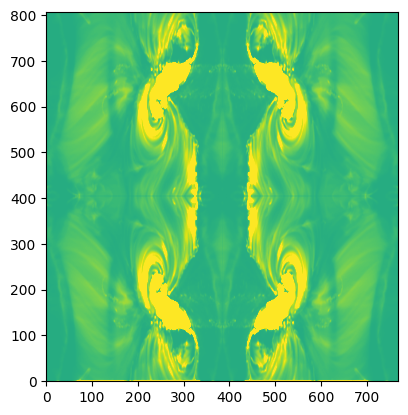

ipdb>  with_core_psf_part = with_core_psf[psfy // 2 +imgy: psfy // 2 + imgy*2, psfx // 2+imgx : psfx // 2 + imgx*2]
ipdb>  plt.imshow(with_core_psf_part, vmax=100) ; plt.show()


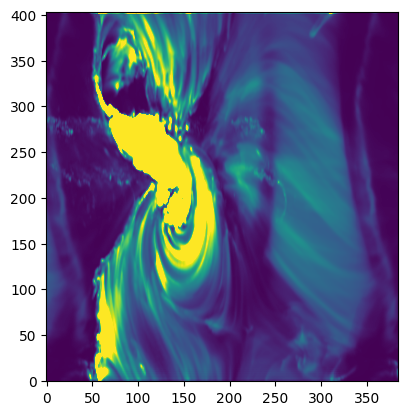

ipdb>  with_core_psf_part = with_core_psf[psfy // 2 +imgy-1: psfy // 2 + imgy*2-1, psfx // 2+imgx : psfx // 2 + imgx*2]
ipdb>  plt.imshow(with_core_psf_part, vmax=100) ; plt.show()


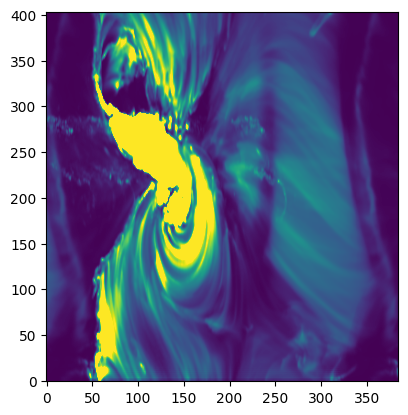

ipdb>  plt.imshow(with_core_psf_part - image.values) ; plt.show()


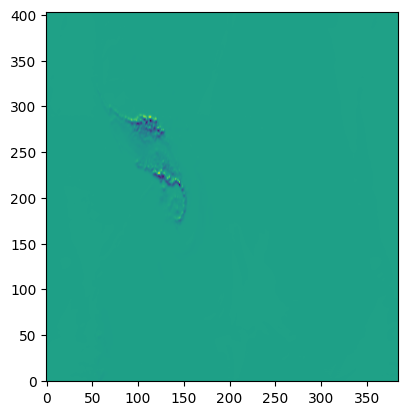

ipdb>  plt.imshow(with_core_psf_part - image.values, vmin=-10, vmax=10) ; plt.show()


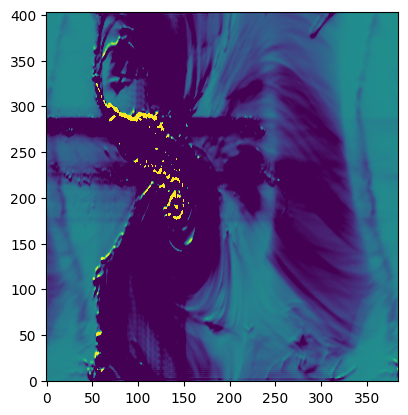

ipdb>  with_core_psf_part = with_core_psf[psfy // 2 : psfy // 2 + imgy*nm, psfx // 2 : psfx // 2 + imgx*nm]
ipdb>  plt.imshow(with_core_psf_part - image.values, vmin=-10, vmax=10) ; plt.show()


*** ValueError: operands could not be broadcast together with shapes (808,770) (404,385)


ipdb>  with_core_psf_part = with_core_psf[psfy // 2 +imgy: psfy // 2 + imgy*2, psfx // 2+imgx : psfx // 2 + imgx*2]
ipdb>  plt.imshow(with_core_psf_part - image.values, vmin=-10, vmax=10) ; plt.show()


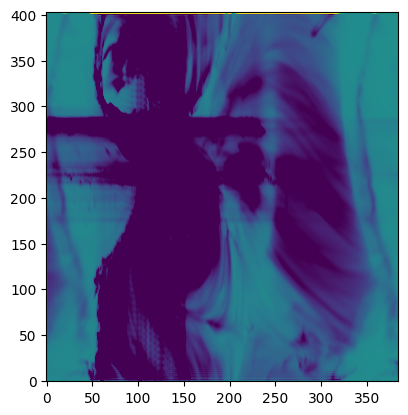

ipdb>  aa = np.real(fftpack.ifftn(fftpack.ifftshift(img__fft / psf__fft)))
ipdb>  aa.shape


(1616, 1540)


ipdb>  plt.imshow(aa, vmax=100, vmin=0) ;plt.show()


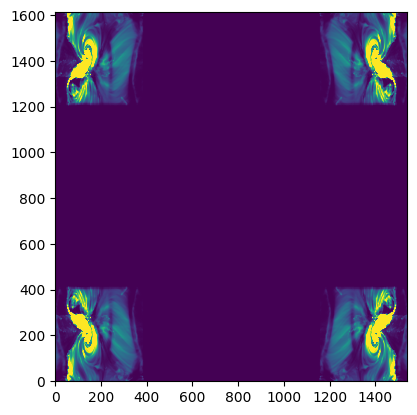

ipdb>  plt.imshow(aa[:imgy, :imgx], vmax=100, vmin=0) ;plt.show()


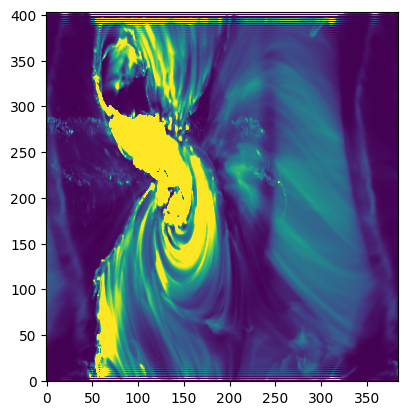

ipdb>  img_fft = fftpac.fftn(img_)


*** NameError: name 'fftpac' is not defined


ipdb>  img_fft = fftpack.fftn(img_)
ipdb>  psf_fft = fftpack.fftn(psf_)
ipdb>  res_ = np.real(fftpack.ifftn(img_fft/psf_fft))
ipdb>  plt.imshow(res_, vmin=0, vmax=100) ; plt.show()


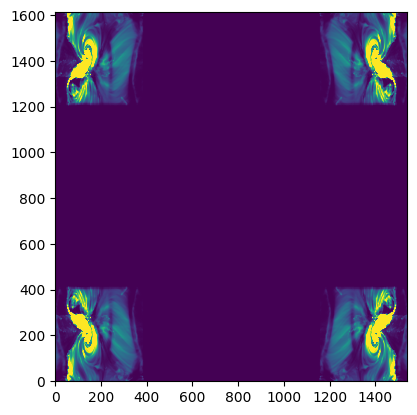

ipdb>  plt.imshow(res_[:imgy, :imgx], vmin=0, vmax=100) ; plt.show()


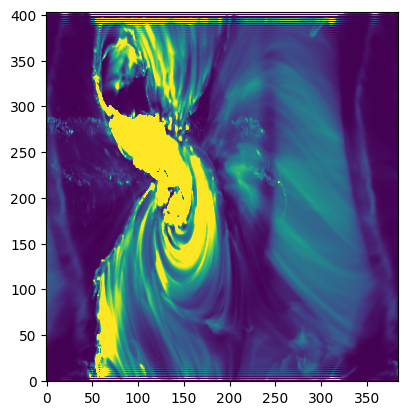

ipdb>  plt.imshow(res_[-imgy:, -imgx:], vmin=0, vmax=100) ; plt.show()


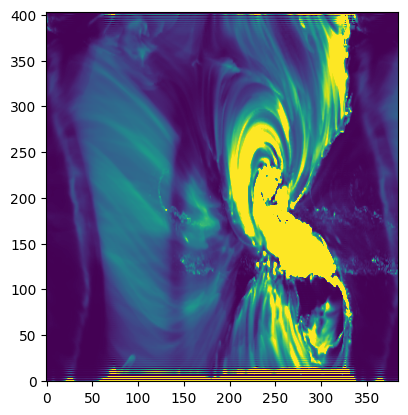

ipdb>  plt.imshow(res_[:imgy, -imgx:], vmin=0, vmax=100) ; plt.show()


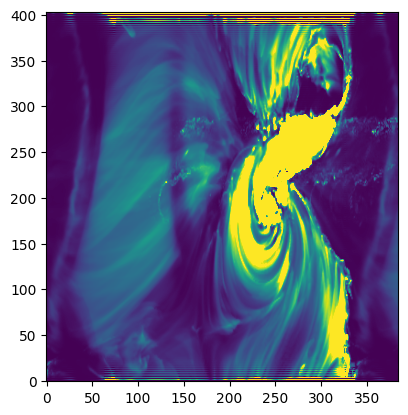

ipdb>  plt.imshow(res_[-imgy:, :imgx], vmin=0, vmax=100) ; plt.show()


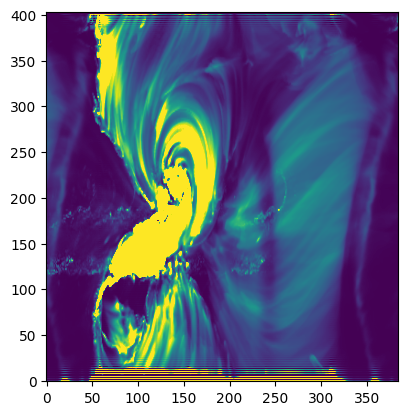

ipdb>  dum = res_[:imgy, :imgx]
ipdb>  dum1 = signal.fftconvolve(dum, gl_core)
ipdb>  plt.imshow(dum1, vmin=0, vmax=100) ; plt.show()


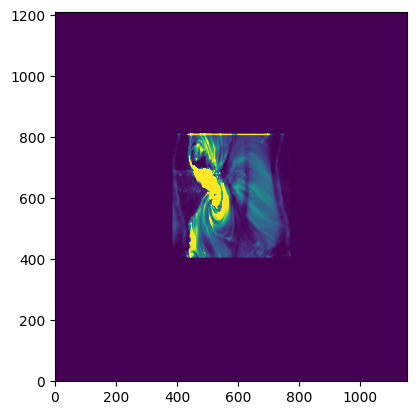

ipdb>  plt.imshow(dum1[psfy//2:psfy//2+imgy, psfx//2:psfx//2+imgx, vmin=0, vmax=100) ; plt.show()


*** SyntaxError: closing parenthesis ')' does not match opening parenthesis '['


ipdb>  plt.imshow(dum1[psfy//2:psfy//2+imgy, psfx//2:psfx//2+imgx], vmin=0, vmax=100) ; plt.show()


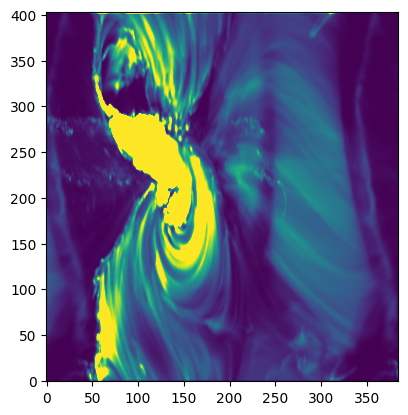

ipdb>  plt.imshow(dum1[psfy//2-1:psfy//2+imgy-1, psfx//2:psfx//2+imgx], vmin=0, vmax=100) ; plt.show()


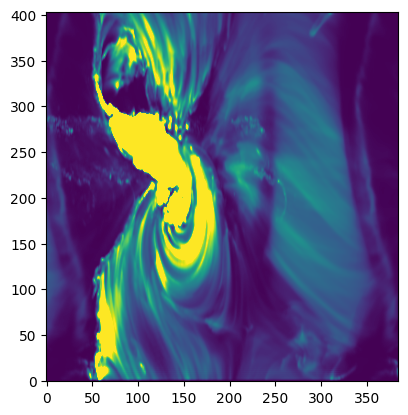

ipdb>  plt.imshow(image.values, vmax=100, vmin=0) ; plt.show()


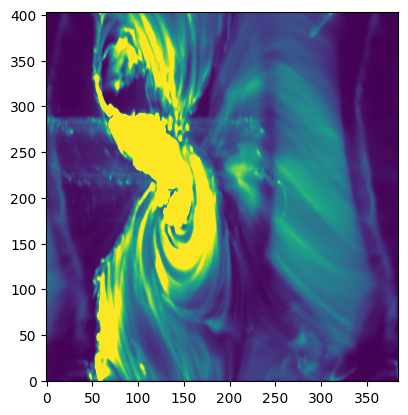

ipdb>  q


In [420]:
pdb.pm()

In [324]:
aa = mm.isel(wave=0).data
aa.shape

(404, 385)

In [327]:
ys, xs = aa.shape
bb = np.zeros(np.array(aa.shape)*2)
bb[:ys, :xs] = aa
bb[:ys, -xs:] = aa[:, ::-1]
bb[-ys:, :xs] = aa[::-1, :]
bb[-ys:, -xs:] = aa[::-1, ::-1]

In [399]:
npad = 2
ys, xs = aa.shape
bb = np.zeros(np.array(aa.shape)*npad)
for jj in range(npad):
    for ii in range(npad):
        ry = 1 if jj == 1 else -1
        rx = 1 if ii == 1 else -1
        bb[jj*ys:(jj+1)*ys, ii*xs:(ii+1)*xs] = aa[::ry, ::rx]

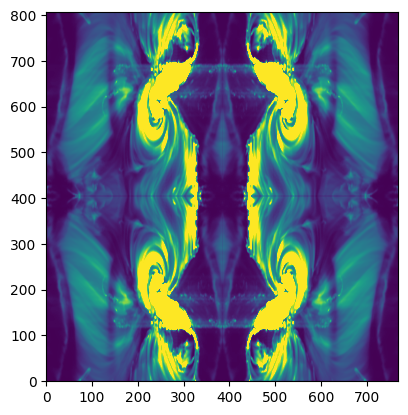

In [400]:
plt.imshow(bb, vmax=100)

In [401]:
bb0 = xr.DataArray(bb[None, :, :], dims=['wave', 'y', 'x'], 
                   coords={'wave':mm.wave, 'y':np.arange(404*npad), 'x':np.arange(385*npad)})

In [402]:
from muse.instr.mono_diffraction import diffraction_removal_in_2d
cc = diffraction_removal_in_2d(bb0.isel(wave=0), gausslobes_kwarg=kargs)

[None]

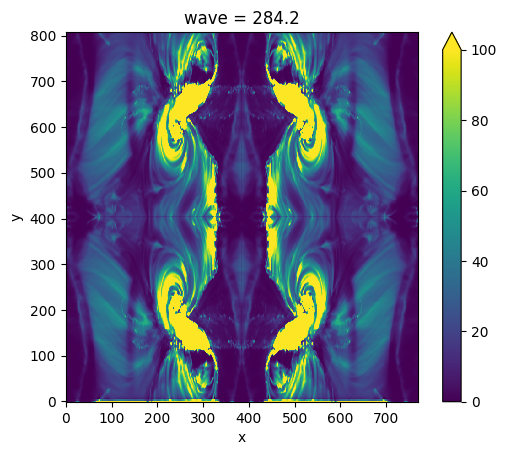

In [405]:
cc.plot(vmax=100)
plt.gca().set(aspect='equal')

In [ ]:
plt.plot(specsum_diff.flux.isel(band=1, step